# Домашнее задание №6: Object Detection (train)

**Студент**: Сизиков Константин

**Цель**: Обучить object detection модель из Detectron2 детектировать игроков в баскетбольном матче. Число классов: 2 (две команды).

В качестве модели следует взять одну из предобученных моделей (Faster R-CNN или RetinaNet).

**Датасет**: https://drive.google.com/file/d/1hbVuyL3UJPDP6VE0F6aZ3fSVy4wXCsVS/view?usp=drive_link

**Структура датасета**: https://colab.research.google.com/drive/1cCV0Fk2yKWM1JpWjlY2o662etii3VHY_?usp=sharing


In [1]:
import sys, os, json, random, itertools, copy
import numpy as np
import torch, torchvision

print("python     :", sys.version.split()[0])
print("executable :", sys.executable)
print("torch      :", torch.__version__)
print("torchvision:", torchvision.__version__)
print("CUDA avail :", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU        :", torch.cuda.get_device_name(0))

python     : 3.11.5
executable : /home/ubuntu/projects/ml/cv/hw_06/.venv/bin/python
torch      : 2.6.0+cu124
torchvision: 0.21.0+cu124
CUDA avail : True
GPU        : NVIDIA GeForce RTX 3090


In [2]:
import detectron2
from detectron2.utils.logger import setup_logger

setup_logger()
print("detectron2 :", detectron2.__version__)

detectron2 : 0.6


In [3]:
import cv2
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image

from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.utils.visualizer import Visualizer, ColorMode

%matplotlib inline
plt.rcParams["figure.figsize"] = (14, 8)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
_ = torch.manual_seed(SEED)

## 1. Датасет

In [4]:
DATA_ROOT = "otus_basketball_dataset_v2"

SPLITS = {
    "train": {
        "anno": os.path.join(DATA_ROOT, "anno_train.json"),
        "images": os.path.join(DATA_ROOT, "images_train"),
    },
    "test": {
        "anno": os.path.join(DATA_ROOT, "anno_test.json"),
        "images": os.path.join(DATA_ROOT, "images_test"),
    },
}

# 2 класса = 2 команды
THING_CLASSES = ["team_0", "team_1"]
NUM_CLASSES = len(THING_CLASSES)

OUTPUT_DIR = "./output"
os.makedirs(OUTPUT_DIR, exist_ok=True)

for split, p in SPLITS.items():
    n_img = len([f for f in os.listdir(p["images"]) if f.lower().endswith((".jpg", ".jpeg", ".png"))])
    with open(p["anno"]) as f:
        anno = json.load(f)
    n_box = sum(len(v) for v in anno.values())
    print(f"{split:5s}: изображений на диске = {n_img:4d}, в аннотации = {len(anno):4d}, боксов = {n_box:5d}")

train: изображений на диске =  400, в аннотации =  400, боксов =  2746
test : изображений на диске =  100, в аннотации =  100, боксов =   660


### 1.2. Разбор формата аннотаций

В JSON бокс хранится как `[x, y, w, h]` в **нормированных** координатах.
Убедимся, что `(x, y)` — это **левый верхний угол**, а не центр: рядом с картинками лежат
`.txt` файлы в формате YOLO (`class cx cy w h`), их можно использовать как перекрёстную проверку.

In [5]:
with open(SPLITS["train"]["anno"]) as f:
    train_anno_raw = json.load(f)

sample_name = sorted(train_anno_raw)[0]
print("Пример записи для", sample_name)
print(json.dumps(train_anno_raw[sample_name], indent=2)[:600], "...\n")

# Сверка с YOLO-разметкой (.txt рядом с изображением): cx = x + w/2, cy = y + h/2
txt_path = os.path.join(SPLITS["train"]["images"], sample_name.rsplit(".", 1)[0] + ".txt")
if os.path.exists(txt_path):
    yolo = [list(map(float, ln.split())) for ln in open(txt_path).read().strip().split("\n")]
    print(f"{'json [x,y,w,h]':>62s}   ->  {'x+w/2, y+h/2':>18s}   {'yolo cx,cy':>18s}")
    for (pid, a), y in zip(train_anno_raw[sample_name].items(), yolo):
        x0, y0, w, h = a["box"]
        print(f"{str([round(v, 4) for v in a['box']]):>62s}   ->  "
              f"{x0 + w / 2:8.4f},{y0 + h / 2:8.4f}   {y[1]:8.4f},{y[2]:8.4f}")
    print("\n=> (x, y) в JSON — левый ВЕРХНИЙ УГОЛ бокса, формат XYWH.")

Пример записи для 000256.jpeg
{
  "20": {
    "box": [
      0.24962628403460746,
      0.11140376121522681,
      0.0671472597220639,
      0.23091108578361821
    ],
    "team": 0
  },
  "11": {
    "box": [
      0.2266387320057002,
      0.34866911737913475,
      0.052639411719238895,
      0.24951755651285445
    ],
    "team": 0
  },
  "2": {
    "box": [
      0.6931557525618904,
      0.4731945228412747,
      0.0732743736875129,
      0.26080628961483754
    ],
    "team": 1
  },
  "0": {
    "box": [
      0.5704670267626252,
      0.09034004598823629,
      0.06753896019904879,
      0.16664101780646795
    ],
 ...

                                                json [x,y,w,h]   ->        x+w/2, y+h/2           yolo cx,cy
                              [0.2496, 0.1114, 0.0671, 0.2309]   ->    0.2832,  0.2269     0.2832,  0.2269
                              [0.2266, 0.3487, 0.0526, 0.2495]   ->    0.2530,  0.4734     0.2530,  0.4734
                              [0.6932, 0.

### 1.3. EDA

In [6]:
from collections import Counter

for split, p in SPLITS.items():
    with open(p["anno"]) as f:
        anno = json.load(f)
    per_img = [len(v) for v in anno.values()]
    teams = Counter(a["team"] for v in anno.values() for a in v.values())
    ws, hs = [], []
    for v in anno.values():
        for a in v.values():
            ws.append(a["box"][2])
            hs.append(a["box"][3])
    print(f"--- {split} ---")
    print(f"  изображений      : {len(anno)}")
    print(f"  боксов           : {sum(per_img)}  (на кадр: min={min(per_img)}, "
          f"mean={np.mean(per_img):.2f}, max={max(per_img)})")
    print(f"  по командам      : team_0={teams[0]}, team_1={teams[1]}")
    print(f"  относит. размеры : w={np.mean(ws):.3f}+-{np.std(ws):.3f}, "
          f"h={np.mean(hs):.3f}+-{np.std(hs):.3f}")

--- train ---
  изображений      : 400
  боксов           : 2746  (на кадр: min=3, mean=6.87, max=10)
  по командам      : team_0=1378, team_1=1368
  относит. размеры : w=0.062+-0.013, h=0.189+-0.029
--- test ---
  изображений      : 100
  боксов           : 660  (на кадр: min=3, mean=6.60, max=10)
  по командам      : team_0=377, team_1=283
  относит. размеры : w=0.060+-0.013, h=0.181+-0.032


In [7]:
# Размеры изображений
sizes = Counter()
for split, p in SPLITS.items():
    for fn in os.listdir(p["images"]):
        if fn.lower().endswith((".jpg", ".jpeg", ".png")):
            sizes[Image.open(os.path.join(p["images"], fn)).size] += 1
print("Разрешения изображений:", dict(sizes))

Разрешения изображений: {(1280, 720): 500}


### 1.4. Адаптация к внутреннему формату Detectron2

Detectron2 ожидает список словарей ([стандартный формат](https://detectron2.readthedocs.io/tutorials/datasets.html)):

```
{
  "file_name": str, "image_id": int, "height": int, "width": int,
  "annotations": [{"bbox": [...], "bbox_mode": BoxMode.XYXY_ABS, "category_id": int}, ...]
}
```

Что делаем при конвертации:

* умножаем нормированные координаты на размеры кадра;
* переводим `XYWH` → `XYXY` (можно было бы отдать и `BoxMode.XYWH_ABS`, но `XYXY_ABS` нагляднее);
* **обрезаем** боксы по границам кадра — в разметке есть боксы, слегка выходящие за кадр;
* `category_id = team` (0 или 1);
* `player_id` игнорируем — в задаче он не нужен.

In [8]:
def get_basketball_dicts(anno_path, img_dir):
    '''Конвертирует аннотации otus_basketball_dataset_v2 в формат датасетов Detectron2.'''
    with open(anno_path) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for image_id, file_name in enumerate(sorted(imgs_anns)):
        players = imgs_anns[file_name]
        full_path = os.path.join(img_dir, file_name)
        width, height = Image.open(full_path).size  # быстрее, чем cv2.imread

        objs = []
        for player_id, player in players.items():
            xn, yn, wn, hn = player["box"]
            # нормированные -> абсолютные пиксельные координаты
            x0, y0 = xn * width, yn * height
            x1, y1 = (xn + wn) * width, (yn + hn) * height
            # обрезка по границам кадра
            x0, x1 = float(np.clip(x0, 0, width)), float(np.clip(x1, 0, width))
            y0, y1 = float(np.clip(y0, 0, height)), float(np.clip(y1, 0, height))
            if x1 - x0 < 1 or y1 - y0 < 1:  # вырожденные боксы отбрасываем
                continue
            objs.append({
                "bbox": [x0, y0, x1, y1],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": int(player["team"]),
            })

        dataset_dicts.append({
            "file_name": full_path,
            "image_id": image_id,
            "height": height,
            "width": width,
            "annotations": objs,
        })
    return dataset_dicts


train_dicts = get_basketball_dicts(SPLITS["train"]["anno"], SPLITS["train"]["images"])
test_dicts = get_basketball_dicts(SPLITS["test"]["anno"], SPLITS["test"]["images"])

print(f"train: {len(train_dicts)} изображений, {sum(len(d['annotations']) for d in train_dicts)} боксов")
print(f"test : {len(test_dicts)} изображений, {sum(len(d['annotations']) for d in test_dicts)} боксов")
print("\nПример записи в формате Detectron2:")
print(json.dumps({**train_dicts[0], "annotations": train_dicts[0]["annotations"][:2]}, indent=2, default=str))

train: 400 изображений, 2746 боксов
test : 100 изображений, 660 боксов

Пример записи в формате Detectron2:
{
  "file_name": "otus_basketball_dataset_v2/images_train/000256.jpeg",
  "image_id": 0,
  "height": 720,
  "width": 1280,
  "annotations": [
    {
      "bbox": [
        319.52164356429756,
        80.2107080749633,
        405.47013600853927,
        246.4666898391684
      ],
      "bbox_mode": 0,
      "category_id": 0
    },
    {
      "bbox": [
        290.0975769672963,
        251.041764512977,
        357.47602396792206,
        430.69440520223225
      ],
      "bbox_mode": 0,
      "category_id": 0
    }
  ]
}


### 1.5. Регистрация датасетов в `DatasetCatalog` / `MetadataCatalog`

In [9]:
DATASET_NAMES = {"train": "basketball_train", "test": "basketball_test"}

for split, name in DATASET_NAMES.items():
    if name in DatasetCatalog.list():
        DatasetCatalog.remove(name)
    if name in MetadataCatalog.list():
        MetadataCatalog.remove(name)
    DatasetCatalog.register(
        name,
        lambda s=split: get_basketball_dicts(SPLITS[s]["anno"], SPLITS[s]["images"]),
    )
    MetadataCatalog.get(name).set(thing_classes=THING_CLASSES)

basketball_metadata = MetadataCatalog.get(DATASET_NAMES["train"])
print(basketball_metadata)
print("\nЗарегистрировано:", [n for n in DatasetCatalog.list() if n.startswith("basketball")])

Metadata(name='basketball_train', thing_classes=['team_0', 'team_1'])

Зарегистрировано: ['basketball_train', 'basketball_test']


### 1.6. Визуальная проверка разметки

Самая частая ошибка при адаптации датасета — перепутанный формат боксов, поэтому
обязательно рисуем ground truth поверх изображений.

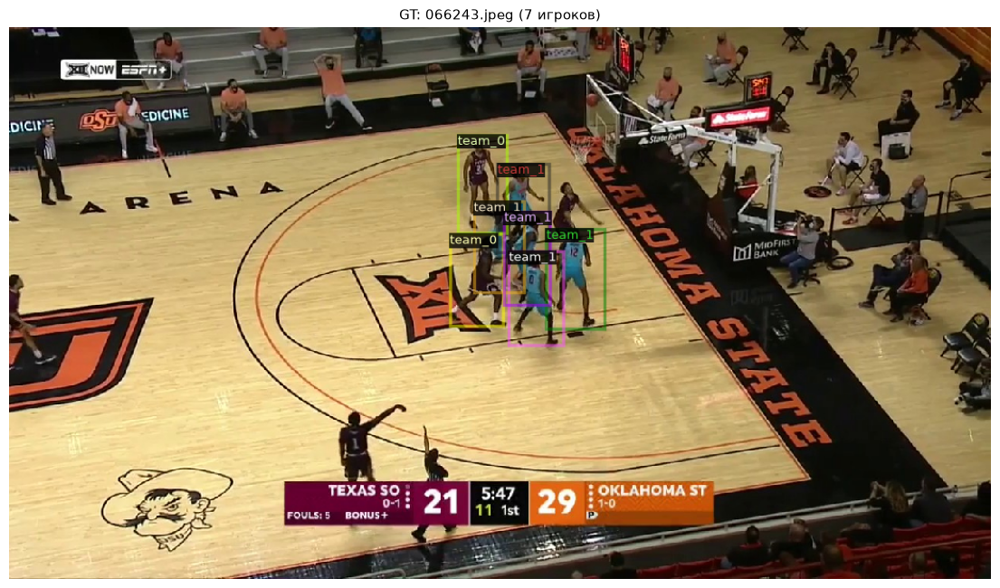

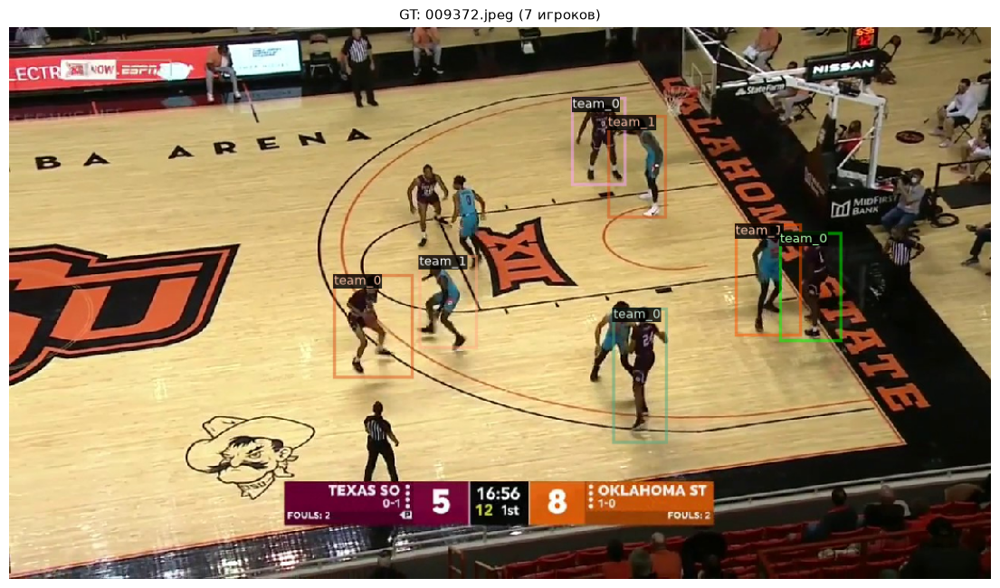

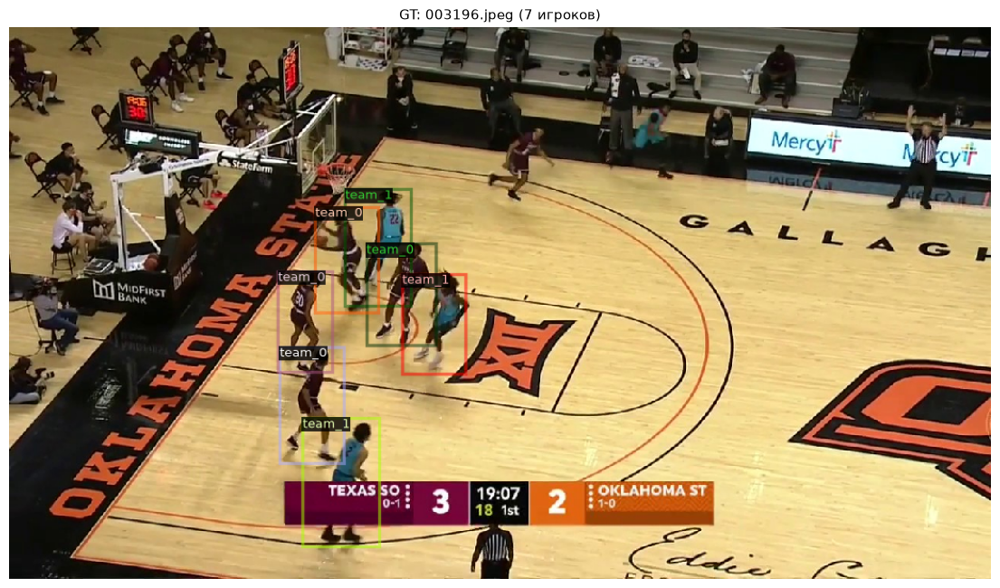

In [10]:
def show(img_rgb, title=None, ax=None):
    if ax is None:
        _, ax = plt.subplots(figsize=(14, 8))
    ax.imshow(img_rgb)
    ax.axis("off")
    if title:
        ax.set_title(title, fontsize=11)
    return ax


random.seed(SEED)
for d in random.sample(train_dicts, 3):
    img = cv2.imread(d["file_name"])
    vis = Visualizer(img[:, :, ::-1], metadata=basketball_metadata, scale=0.8)
    out = vis.draw_dataset_dict(d)
    show(out.get_image(), f"GT: {os.path.basename(d['file_name'])} "
                          f"({len(d['annotations'])} игроков)")
    plt.show()

## 2. Обучение модели

Берём предобученную на COCO **Faster R-CNN R50-FPN (3x)** из
[Detectron2 Model Zoo](https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md#coco-object-detection-baselines)
и дообучаем её на нашем датасете, заменив голову классификатора на 2 класса.

Замечания по гиперпараметрам:

* `IMS_PER_BATCH = 4`, 400 train-изображений → **100 итераций = 1 эпоха**;
  `MAX_ITER = 3000` ≈ 30 эпох.
* `BASE_LR = 0.0025` — линейное правило масштабирования от дефолтных `0.02` при batch 16.
* `STEPS = (2000, 2600)` — двухступенчатое снижение LR в 10 раз.
* `MODEL.ROI_HEADS.NUM_CLASSES = 2` — именно число классов, **без** фонового класса.
* Оценка на тесте каждые `TEST.EVAL_PERIOD = 500` итераций — видно динамику mAP.

In [11]:
MODEL_NAME = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(MODEL_NAME))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(MODEL_NAME)  # веса, предобученные на COCO

cfg.DATASETS.TRAIN = (DATASET_NAMES["train"],)
cfg.DATASETS.TEST = (DATASET_NAMES["test"],)
cfg.DATALOADER.NUM_WORKERS = 4

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 3000
cfg.SOLVER.STEPS = (2000, 2600)
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.WARMUP_ITERS = 200
cfg.SOLVER.CHECKPOINT_PERIOD = 1000

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

cfg.TEST.EVAL_PERIOD = 500
cfg.OUTPUT_DIR = OUTPUT_DIR
cfg.SEED = SEED
cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
with open(os.path.join(cfg.OUTPUT_DIR, "config.yaml"), "w") as f:
    f.write(cfg.dump())

print(f"модель      : {MODEL_NAME}")
print(f"устройство  : {cfg.MODEL.DEVICE}")
print(f"итераций    : {cfg.SOLVER.MAX_ITER} (~{cfg.SOLVER.MAX_ITER * cfg.SOLVER.IMS_PER_BATCH / len(train_dicts):.0f} эпох)")

модель      : COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml
устройство  : cuda
итераций    : 3000 (~30 эпох)


In [12]:
class BasketballTrainer(DefaultTrainer):
    '''DefaultTrainer + COCOEvaluator, чтобы считать mAP прямо во время обучения.'''

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        os.makedirs(output_folder, exist_ok=True)
        return COCOEvaluator(dataset_name, output_dir=output_folder)

In [13]:
%%time
trainer = BasketballTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/23 12:30:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[08/23 12:30:33 d2.data.build]: Removed 0 images with no usable annotations. 400 images left.


[08/23 12:30:33 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|   team_0   | 1378         |   team_1   | 1368         |
|            |              |            |              |
|   total    | 2746         |            |              |


[08/23 12:30:33 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]


[08/23 12:30:33 d2.data.build]: Using training sampler TrainingSampler


[08/23 12:30:33 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 12:30:33 d2.data.common]: Serializing 400 elements to byte tensors and concatenating them all ...


[08/23 12:30:33 d2.data.common]: Serialized dataset takes 0.22 MiB


[08/23 12:30:33 d2.data.build]: Making batched data loader with batch_size=4


[08/23 12:30:33 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


/home/ubuntu/projects/ml/cv/hw_06/.venv/lib/python3.11/site-packages/detectron2/checkpoint/detection_checkpoint.py:73: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  data = pickle.load(f, encoding="latin1")


Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.


Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.


Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.


Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.


Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/23 12:30:33 d2.engine.train_loop]: Starting training from iteration 0


/home/ubuntu/projects/ml/cv/hw_06/.venv/lib/python3.11/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/23 12:30:52 d2.utils.events]:  eta: 0:45:54  iter: 19  total_loss: 1.879  loss_cls: 1.054  loss_box_reg: 0.6753  loss_rpn_cls: 0.08455  loss_rpn_loc: 0.03397    time: 0.9099  last_time: 0.9135  data_time: 0.0097  last_data_time: 0.0037   lr: 0.00023976  max_mem: 4058M


[08/23 12:31:11 d2.utils.events]:  eta: 0:45:52  iter: 39  total_loss: 1.355  loss_cls: 0.546  loss_box_reg: 0.7647  loss_rpn_cls: 0.03819  loss_rpn_loc: 0.02616    time: 0.9225  last_time: 0.9593  data_time: 0.0036  last_data_time: 0.0036   lr: 0.00048951  max_mem: 4058M


[08/23 12:31:29 d2.utils.events]:  eta: 0:45:40  iter: 59  total_loss: 1.269  loss_cls: 0.4499  loss_box_reg: 0.7693  loss_rpn_cls: 0.02336  loss_rpn_loc: 0.02599    time: 0.9234  last_time: 0.8808  data_time: 0.0036  last_data_time: 0.0036   lr: 0.00073926  max_mem: 4058M


[08/23 12:31:48 d2.utils.events]:  eta: 0:45:31  iter: 79  total_loss: 1.221  loss_cls: 0.4241  loss_box_reg: 0.7456  loss_rpn_cls: 0.01399  loss_rpn_loc: 0.02261    time: 0.9264  last_time: 0.9615  data_time: 0.0037  last_data_time: 0.0037   lr: 0.00098901  max_mem: 4058M


[08/23 12:32:07 d2.utils.events]:  eta: 0:45:17  iter: 99  total_loss: 1.038  loss_cls: 0.4157  loss_box_reg: 0.5852  loss_rpn_cls: 0.009416  loss_rpn_loc: 0.02436    time: 0.9289  last_time: 0.8962  data_time: 0.0036  last_data_time: 0.0037   lr: 0.0012388  max_mem: 4058M


[08/23 12:32:26 d2.utils.events]:  eta: 0:45:10  iter: 119  total_loss: 0.9309  loss_cls: 0.4315  loss_box_reg: 0.4873  loss_rpn_cls: 0.007362  loss_rpn_loc: 0.02222    time: 0.9334  last_time: 0.9578  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0014885  max_mem: 4058M


[08/23 12:32:45 d2.utils.events]:  eta: 0:45:02  iter: 139  total_loss: 0.8938  loss_cls: 0.4104  loss_box_reg: 0.4502  loss_rpn_cls: 0.005519  loss_rpn_loc: 0.02221    time: 0.9362  last_time: 0.9660  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0017383  max_mem: 4058M


[08/23 12:33:04 d2.utils.events]:  eta: 0:44:55  iter: 159  total_loss: 0.8636  loss_cls: 0.402  loss_box_reg: 0.439  loss_rpn_cls: 0.004811  loss_rpn_loc: 0.02277    time: 0.9388  last_time: 0.9718  data_time: 0.0036  last_data_time: 0.0036   lr: 0.001988  max_mem: 4058M


[08/23 12:33:23 d2.utils.events]:  eta: 0:44:48  iter: 179  total_loss: 0.8299  loss_cls: 0.3857  loss_box_reg: 0.4202  loss_rpn_cls: 0.004555  loss_rpn_loc: 0.02142    time: 0.9413  last_time: 0.9646  data_time: 0.0037  last_data_time: 0.0039   lr: 0.0022378  max_mem: 4058M


[08/23 12:33:43 d2.utils.events]:  eta: 0:44:37  iter: 199  total_loss: 0.7567  loss_cls: 0.2969  loss_box_reg: 0.4204  loss_rpn_cls: 0.007403  loss_rpn_loc: 0.02214    time: 0.9428  last_time: 0.9031  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0024875  max_mem: 4058M


[08/23 12:34:01 d2.utils.events]:  eta: 0:44:18  iter: 219  total_loss: 0.7188  loss_cls: 0.2891  loss_box_reg: 0.4025  loss_rpn_cls: 0.004616  loss_rpn_loc: 0.01947    time: 0.9427  last_time: 0.9493  data_time: 0.0036  last_data_time: 0.0033   lr: 0.0025  max_mem: 4058M


[08/23 12:34:20 d2.utils.events]:  eta: 0:44:02  iter: 239  total_loss: 0.6983  loss_cls: 0.2739  loss_box_reg: 0.393  loss_rpn_cls: 0.004449  loss_rpn_loc: 0.02065    time: 0.9429  last_time: 0.9627  data_time: 0.0039  last_data_time: 0.0036   lr: 0.0025  max_mem: 4058M


[08/23 12:34:39 d2.utils.events]:  eta: 0:43:44  iter: 259  total_loss: 0.6885  loss_cls: 0.2604  loss_box_reg: 0.4101  loss_rpn_cls: 0.004577  loss_rpn_loc: 0.01967    time: 0.9438  last_time: 0.9518  data_time: 0.0038  last_data_time: 0.0038   lr: 0.0025  max_mem: 4058M


[08/23 12:34:52 d2.utils.events]:  eta: 0:43:23  iter: 279  total_loss: 0.6573  loss_cls: 0.2647  loss_box_reg: 0.3734  loss_rpn_cls: 0.006151  loss_rpn_loc: 0.01929    time: 0.9227  last_time: 0.2457  data_time: 0.0038  last_data_time: 0.0038   lr: 0.0025  max_mem: 4058M


[08/23 12:35:01 d2.utils.events]:  eta: 0:42:58  iter: 299  total_loss: 0.6443  loss_cls: 0.2384  loss_box_reg: 0.3698  loss_rpn_cls: 0.004577  loss_rpn_loc: 0.02025    time: 0.8908  last_time: 0.9429  data_time: 0.0037  last_data_time: 0.0041   lr: 0.0025  max_mem: 4058M


[08/23 12:35:20 d2.utils.events]:  eta: 0:42:39  iter: 319  total_loss: 0.654  loss_cls: 0.2585  loss_box_reg: 0.3734  loss_rpn_cls: 0.004696  loss_rpn_loc: 0.01855    time: 0.8947  last_time: 0.9607  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4058M


[08/23 12:35:39 d2.utils.events]:  eta: 0:42:19  iter: 339  total_loss: 0.649  loss_cls: 0.2553  loss_box_reg: 0.3661  loss_rpn_cls: 0.002152  loss_rpn_loc: 0.01969    time: 0.8980  last_time: 0.9533  data_time: 0.0040  last_data_time: 0.0037   lr: 0.0025  max_mem: 4058M


[08/23 12:35:58 d2.utils.events]:  eta: 0:42:00  iter: 359  total_loss: 0.6394  loss_cls: 0.2494  loss_box_reg: 0.3571  loss_rpn_cls: 0.002739  loss_rpn_loc: 0.01919    time: 0.8998  last_time: 0.9517  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4058M


[08/23 12:36:17 d2.utils.events]:  eta: 0:41:41  iter: 379  total_loss: 0.6254  loss_cls: 0.2489  loss_box_reg: 0.3602  loss_rpn_cls: 0.006427  loss_rpn_loc: 0.01981    time: 0.9023  last_time: 0.9455  data_time: 0.0036  last_data_time: 0.0038   lr: 0.0025  max_mem: 4058M


[08/23 12:36:36 d2.utils.events]:  eta: 0:41:20  iter: 399  total_loss: 0.6463  loss_cls: 0.2398  loss_box_reg: 0.365  loss_rpn_cls: 0.003141  loss_rpn_loc: 0.01921    time: 0.9036  last_time: 0.9166  data_time: 0.0037  last_data_time: 0.0033   lr: 0.0025  max_mem: 4058M


[08/23 12:36:55 d2.utils.events]:  eta: 0:41:02  iter: 419  total_loss: 0.6133  loss_cls: 0.2411  loss_box_reg: 0.3496  loss_rpn_cls: 0.003199  loss_rpn_loc: 0.01866    time: 0.9058  last_time: 0.9150  data_time: 0.0036  last_data_time: 0.0035   lr: 0.0025  max_mem: 4058M


[08/23 12:37:13 d2.utils.events]:  eta: 0:40:43  iter: 439  total_loss: 0.5986  loss_cls: 0.2463  loss_box_reg: 0.3392  loss_rpn_cls: 0.004328  loss_rpn_loc: 0.01836    time: 0.9075  last_time: 0.9610  data_time: 0.0037  last_data_time: 0.0037   lr: 0.0025  max_mem: 4058M


[08/23 12:37:32 d2.utils.events]:  eta: 0:40:23  iter: 459  total_loss: 0.615  loss_cls: 0.2495  loss_box_reg: 0.349  loss_rpn_cls: 0.002953  loss_rpn_loc: 0.01907    time: 0.9087  last_time: 0.9253  data_time: 0.0039  last_data_time: 0.0039   lr: 0.0025  max_mem: 4058M


[08/23 12:37:51 d2.utils.events]:  eta: 0:40:02  iter: 479  total_loss: 0.6057  loss_cls: 0.2432  loss_box_reg: 0.3557  loss_rpn_cls: 0.005134  loss_rpn_loc: 0.01835    time: 0.9100  last_time: 0.9558  data_time: 0.0039  last_data_time: 0.0038   lr: 0.0025  max_mem: 4058M


[08/23 12:38:10 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|   team_0   | 377          |   team_1   | 283          |
|            |              |            |              |
|   total    | 660          |            |              |


[08/23 12:38:10 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 12:38:10 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 12:38:10 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 12:38:10 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 12:38:10 d2.evaluation.coco_evaluation]: Trying to convert 'basketball_test' to COCO format ...


[08/23 12:38:10 d2.data.datasets.coco]: Converting annotations of dataset 'basketball_test' to COCO format ...)


[08/23 12:38:10 d2.data.datasets.coco]: Converting dataset dicts into COCO format


[08/23 12:38:10 d2.data.datasets.coco]: Conversion finished, #images: 100, #annotations: 660


[08/23 12:38:10 d2.data.datasets.coco]: Caching COCO format annotations at './output/inference/basketball_test_coco_format.json' ...


[08/23 12:38:10 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 12:38:11 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0004 s/iter. Inference: 0.1369 s/iter. Eval: 0.0002 s/iter. Total: 0.1374 s/iter. ETA=0:00:12


[08/23 12:38:17 d2.evaluation.evaluator]: Inference done 48/100. Dataloading: 0.0007 s/iter. Inference: 0.1369 s/iter. Eval: 0.0001 s/iter. Total: 0.1377 s/iter. ETA=0:00:07


[08/23 12:38:22 d2.evaluation.evaluator]: Inference done 85/100. Dataloading: 0.0007 s/iter. Inference: 0.1369 s/iter. Eval: 0.0001 s/iter. Total: 0.1378 s/iter. ETA=0:00:02


[08/23 12:38:24 d2.evaluation.evaluator]: Total inference time: 0:00:13.104724 (0.137944 s / iter per device, on 1 devices)


[08/23 12:38:24 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:13 (0.136913 s / iter per device, on 1 devices)


[08/23 12:38:24 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 12:38:24 d2.evaluation.coco_evaluation]: Saving results to ./output/inference/coco_instances_results.json


[08/23 12:38:24 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 12:38:24 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 12:38:24 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 12:38:24 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 12:38:24 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.408
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.678
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.465
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.424
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.147
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.642
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.644
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.646
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.643
[08/23 12:38:24 d2.evaluation.coco_eva

[08/23 12:38:24 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 12:38:24 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 44.846 | team_1     | 36.811 |


[08/23 12:38:24 d2.engine.defaults]: Evaluation results for basketball_test in csv format:


[08/23 12:38:24 d2.evaluation.testing]: copypaste: Task: bbox


[08/23 12:38:24 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl


[08/23 12:38:24 d2.evaluation.testing]: copypaste: 40.8287,67.7667,46.5164,nan,40.2134,42.4233


[08/23 12:38:24 d2.utils.events]:  eta: 0:39:44  iter: 499  total_loss: 0.6392  loss_cls: 0.2506  loss_box_reg: 0.3591  loss_rpn_cls: 0.00424  loss_rpn_loc: 0.02068    time: 0.9112  last_time: 0.9174  data_time: 0.0039  last_data_time: 0.0041   lr: 0.0025  max_mem: 4058M


[08/23 12:38:43 d2.utils.events]:  eta: 0:39:24  iter: 519  total_loss: 0.6039  loss_cls: 0.2305  loss_box_reg: 0.329  loss_rpn_cls: 0.00632  loss_rpn_loc: 0.01883    time: 0.9126  last_time: 0.9499  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4058M


[08/23 12:39:01 d2.utils.events]:  eta: 0:39:05  iter: 539  total_loss: 0.5833  loss_cls: 0.2233  loss_box_reg: 0.3413  loss_rpn_cls: 0.003393  loss_rpn_loc: 0.01929    time: 0.9129  last_time: 0.9162  data_time: 0.0038  last_data_time: 0.0038   lr: 0.0025  max_mem: 4058M


[08/23 12:39:20 d2.utils.events]:  eta: 0:38:47  iter: 559  total_loss: 0.5988  loss_cls: 0.2428  loss_box_reg: 0.3437  loss_rpn_cls: 0.003422  loss_rpn_loc: 0.01763    time: 0.9143  last_time: 0.9428  data_time: 0.0039  last_data_time: 0.0039   lr: 0.0025  max_mem: 4058M


[08/23 12:39:38 d2.utils.events]:  eta: 0:38:27  iter: 579  total_loss: 0.6218  loss_cls: 0.2487  loss_box_reg: 0.3509  loss_rpn_cls: 0.002003  loss_rpn_loc: 0.0187    time: 0.9133  last_time: 0.2593  data_time: 0.0037  last_data_time: 0.0037   lr: 0.0025  max_mem: 4058M


[08/23 12:39:43 d2.utils.events]:  eta: 0:38:05  iter: 599  total_loss: 0.5782  loss_cls: 0.2251  loss_box_reg: 0.3404  loss_rpn_cls: 0.001812  loss_rpn_loc: 0.01765    time: 0.8912  last_time: 0.2407  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4058M


[08/23 12:40:00 d2.utils.events]:  eta: 0:37:45  iter: 619  total_loss: 0.562  loss_cls: 0.218  loss_box_reg: 0.3159  loss_rpn_cls: 0.004089  loss_rpn_loc: 0.01969    time: 0.8895  last_time: 0.9218  data_time: 0.0040  last_data_time: 0.0035   lr: 0.0025  max_mem: 4058M


[08/23 12:40:18 d2.utils.events]:  eta: 0:37:26  iter: 639  total_loss: 0.6192  loss_cls: 0.2491  loss_box_reg: 0.337  loss_rpn_cls: 0.003152  loss_rpn_loc: 0.01959    time: 0.8910  last_time: 0.9158  data_time: 0.0037  last_data_time: 0.0035   lr: 0.0025  max_mem: 4058M


[08/23 12:40:37 d2.utils.events]:  eta: 0:37:06  iter: 659  total_loss: 0.5745  loss_cls: 0.2241  loss_box_reg: 0.3374  loss_rpn_cls: 0.003287  loss_rpn_loc: 0.01831    time: 0.8921  last_time: 0.9179  data_time: 0.0037  last_data_time: 0.0040   lr: 0.0025  max_mem: 4058M


[08/23 12:40:56 d2.utils.events]:  eta: 0:36:47  iter: 679  total_loss: 0.5844  loss_cls: 0.2321  loss_box_reg: 0.3279  loss_rpn_cls: 0.003197  loss_rpn_loc: 0.01805    time: 0.8934  last_time: 0.9634  data_time: 0.0037  last_data_time: 0.0041   lr: 0.0025  max_mem: 4059M


[08/23 12:41:14 d2.utils.events]:  eta: 0:36:26  iter: 699  total_loss: 0.5784  loss_cls: 0.2158  loss_box_reg: 0.3387  loss_rpn_cls: 0.001983  loss_rpn_loc: 0.01753    time: 0.8945  last_time: 0.9461  data_time: 0.0036  last_data_time: 0.0034   lr: 0.0025  max_mem: 4059M


[08/23 12:41:33 d2.utils.events]:  eta: 0:36:07  iter: 719  total_loss: 0.5778  loss_cls: 0.2195  loss_box_reg: 0.3295  loss_rpn_cls: 0.002198  loss_rpn_loc: 0.01766    time: 0.8955  last_time: 0.9173  data_time: 0.0036  last_data_time: 0.0040   lr: 0.0025  max_mem: 4059M


[08/23 12:41:52 d2.utils.events]:  eta: 0:35:47  iter: 739  total_loss: 0.5609  loss_cls: 0.2146  loss_box_reg: 0.3155  loss_rpn_cls: 0.003071  loss_rpn_loc: 0.01797    time: 0.8967  last_time: 0.9541  data_time: 0.0037  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:42:11 d2.utils.events]:  eta: 0:35:28  iter: 759  total_loss: 0.555  loss_cls: 0.2155  loss_box_reg: 0.3075  loss_rpn_cls: 0.003216  loss_rpn_loc: 0.01701    time: 0.8978  last_time: 0.9519  data_time: 0.0037  last_data_time: 0.0034   lr: 0.0025  max_mem: 4059M


[08/23 12:42:30 d2.utils.events]:  eta: 0:35:10  iter: 779  total_loss: 0.5402  loss_cls: 0.2101  loss_box_reg: 0.3201  loss_rpn_cls: 0.003034  loss_rpn_loc: 0.01798    time: 0.8991  last_time: 0.9471  data_time: 0.0036  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:42:48 d2.utils.events]:  eta: 0:34:51  iter: 799  total_loss: 0.6038  loss_cls: 0.2311  loss_box_reg: 0.3485  loss_rpn_cls: 0.001435  loss_rpn_loc: 0.01803    time: 0.9001  last_time: 0.9622  data_time: 0.0038  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:43:07 d2.utils.events]:  eta: 0:34:31  iter: 819  total_loss: 0.5514  loss_cls: 0.2213  loss_box_reg: 0.3326  loss_rpn_cls: 0.002844  loss_rpn_loc: 0.01836    time: 0.9008  last_time: 0.8941  data_time: 0.0038  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:43:26 d2.utils.events]:  eta: 0:34:13  iter: 839  total_loss: 0.5551  loss_cls: 0.2135  loss_box_reg: 0.3188  loss_rpn_cls: 0.002307  loss_rpn_loc: 0.01688    time: 0.9019  last_time: 0.9563  data_time: 0.0036  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:43:44 d2.utils.events]:  eta: 0:33:54  iter: 859  total_loss: 0.5548  loss_cls: 0.1998  loss_box_reg: 0.332  loss_rpn_cls: 0.003291  loss_rpn_loc: 0.01815    time: 0.9025  last_time: 0.9623  data_time: 0.0036  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 12:44:03 d2.utils.events]:  eta: 0:33:35  iter: 879  total_loss: 0.5361  loss_cls: 0.2085  loss_box_reg: 0.3052  loss_rpn_cls: 0.001601  loss_rpn_loc: 0.01836    time: 0.9036  last_time: 0.9550  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:44:22 d2.utils.events]:  eta: 0:33:16  iter: 899  total_loss: 0.5298  loss_cls: 0.2004  loss_box_reg: 0.3085  loss_rpn_cls: 0.002056  loss_rpn_loc: 0.0173    time: 0.9044  last_time: 0.9655  data_time: 0.0036  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:44:30 d2.utils.events]:  eta: 0:32:56  iter: 919  total_loss: 0.4975  loss_cls: 0.2025  loss_box_reg: 0.2902  loss_rpn_cls: 0.003026  loss_rpn_loc: 0.01766    time: 0.8934  last_time: 0.2591  data_time: 0.0038  last_data_time: 0.0034   lr: 0.0025  max_mem: 4059M


[08/23 12:44:42 d2.utils.events]:  eta: 0:32:37  iter: 939  total_loss: 0.5216  loss_cls: 0.2179  loss_box_reg: 0.2911  loss_rpn_cls: 0.002731  loss_rpn_loc: 0.01636    time: 0.8866  last_time: 0.9556  data_time: 0.0035  last_data_time: 0.0032   lr: 0.0025  max_mem: 4059M


[08/23 12:45:01 d2.utils.events]:  eta: 0:32:18  iter: 959  total_loss: 0.5387  loss_cls: 0.2166  loss_box_reg: 0.3101  loss_rpn_cls: 0.003599  loss_rpn_loc: 0.01681    time: 0.8879  last_time: 0.9549  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:45:20 d2.utils.events]:  eta: 0:32:00  iter: 979  total_loss: 0.5215  loss_cls: 0.1851  loss_box_reg: 0.3123  loss_rpn_cls: 0.002837  loss_rpn_loc: 0.01778    time: 0.8892  last_time: 0.8834  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:45:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 12:45:39 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 12:45:39 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 12:45:39 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 12:45:39 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 12:45:40 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0005 s/iter. Inference: 0.1363 s/iter. Eval: 0.0002 s/iter. Total: 0.1371 s/iter. ETA=0:00:12


[08/23 12:45:45 d2.evaluation.evaluator]: Inference done 48/100. Dataloading: 0.0007 s/iter. Inference: 0.1367 s/iter. Eval: 0.0001 s/iter. Total: 0.1375 s/iter. ETA=0:00:07


[08/23 12:45:51 d2.evaluation.evaluator]: Inference done 85/100. Dataloading: 0.0007 s/iter. Inference: 0.1367 s/iter. Eval: 0.0001 s/iter. Total: 0.1376 s/iter. ETA=0:00:02


[08/23 12:45:53 d2.evaluation.evaluator]: Total inference time: 0:00:13.081981 (0.137705 s / iter per device, on 1 devices)


[08/23 12:45:53 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:12 (0.136695 s / iter per device, on 1 devices)


[08/23 12:45:53 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 12:45:53 d2.evaluation.coco_evaluation]: Saving results to ./output/inference/coco_instances_results.json


[08/23 12:45:53 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 12:45:53 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 12:45:53 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 12:45:53 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 12:45:53 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.419
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.685
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.466
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.421
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.430
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.155
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.650
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.650
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.649
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.653
[08/23 12:45:53 d2.evaluation.coco_eva

[08/23 12:45:53 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 12:45:53 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 47.243 | team_1     | 36.594 |


[08/23 12:45:53 d2.engine.defaults]: Evaluation results for basketball_test in csv format:


[08/23 12:45:53 d2.evaluation.testing]: copypaste: Task: bbox


[08/23 12:45:53 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl


[08/23 12:45:53 d2.evaluation.testing]: copypaste: 41.9186,68.5282,46.6030,nan,42.0596,42.9915


[08/23 12:45:53 d2.utils.events]:  eta: 0:31:41  iter: 999  total_loss: 0.5477  loss_cls: 0.1977  loss_box_reg: 0.3113  loss_rpn_cls: 0.003853  loss_rpn_loc: 0.01788    time: 0.8902  last_time: 0.9561  data_time: 0.0040  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:46:11 d2.utils.events]:  eta: 0:31:23  iter: 1019  total_loss: 0.5245  loss_cls: 0.2083  loss_box_reg: 0.2947  loss_rpn_cls: 0.002363  loss_rpn_loc: 0.01664    time: 0.8911  last_time: 0.9559  data_time: 0.0037  last_data_time: 0.0040   lr: 0.0025  max_mem: 4059M


[08/23 12:46:30 d2.utils.events]:  eta: 0:31:05  iter: 1039  total_loss: 0.5254  loss_cls: 0.212  loss_box_reg: 0.2949  loss_rpn_cls: 0.002478  loss_rpn_loc: 0.0162    time: 0.8921  last_time: 0.9523  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:46:49 d2.utils.events]:  eta: 0:30:46  iter: 1059  total_loss: 0.5031  loss_cls: 0.1944  loss_box_reg: 0.2865  loss_rpn_cls: 0.001294  loss_rpn_loc: 0.01698    time: 0.8928  last_time: 0.9518  data_time: 0.0038  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:47:07 d2.utils.events]:  eta: 0:30:26  iter: 1079  total_loss: 0.5333  loss_cls: 0.2023  loss_box_reg: 0.3074  loss_rpn_cls: 0.001308  loss_rpn_loc: 0.01847    time: 0.8935  last_time: 0.9520  data_time: 0.0037  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:47:26 d2.utils.events]:  eta: 0:30:06  iter: 1099  total_loss: 0.5273  loss_cls: 0.1874  loss_box_reg: 0.3072  loss_rpn_cls: 0.00181  loss_rpn_loc: 0.01811    time: 0.8942  last_time: 0.9444  data_time: 0.0037  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 12:47:44 d2.utils.events]:  eta: 0:29:46  iter: 1119  total_loss: 0.5102  loss_cls: 0.1994  loss_box_reg: 0.3007  loss_rpn_cls: 0.001163  loss_rpn_loc: 0.0161    time: 0.8946  last_time: 0.9252  data_time: 0.0037  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:48:03 d2.utils.events]:  eta: 0:29:27  iter: 1139  total_loss: 0.5441  loss_cls: 0.214  loss_box_reg: 0.3064  loss_rpn_cls: 0.002234  loss_rpn_loc: 0.01709    time: 0.8955  last_time: 0.9563  data_time: 0.0037  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 12:48:22 d2.utils.events]:  eta: 0:29:07  iter: 1159  total_loss: 0.4939  loss_cls: 0.1805  loss_box_reg: 0.2897  loss_rpn_cls: 0.002443  loss_rpn_loc: 0.01858    time: 0.8963  last_time: 0.9461  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:48:41 d2.utils.events]:  eta: 0:28:48  iter: 1179  total_loss: 0.4995  loss_cls: 0.1818  loss_box_reg: 0.3013  loss_rpn_cls: 0.001629  loss_rpn_loc: 0.01649    time: 0.8969  last_time: 0.9524  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:48:59 d2.utils.events]:  eta: 0:28:28  iter: 1199  total_loss: 0.4789  loss_cls: 0.1867  loss_box_reg: 0.2814  loss_rpn_cls: 0.001299  loss_rpn_loc: 0.01515    time: 0.8975  last_time: 0.9531  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:49:16 d2.utils.events]:  eta: 0:28:09  iter: 1219  total_loss: 0.5043  loss_cls: 0.1946  loss_box_reg: 0.2846  loss_rpn_cls: 0.001574  loss_rpn_loc: 0.01694    time: 0.8963  last_time: 0.2612  data_time: 0.0037  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:49:21 d2.utils.events]:  eta: 0:27:49  iter: 1239  total_loss: 0.4778  loss_cls: 0.1788  loss_box_reg: 0.2761  loss_rpn_cls: 0.001771  loss_rpn_loc: 0.01593    time: 0.8859  last_time: 0.2062  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:49:40 d2.utils.events]:  eta: 0:27:30  iter: 1259  total_loss: 0.5052  loss_cls: 0.1883  loss_box_reg: 0.2805  loss_rpn_cls: 0.001765  loss_rpn_loc: 0.01578    time: 0.8868  last_time: 0.9404  data_time: 0.0040  last_data_time: 0.0040   lr: 0.0025  max_mem: 4059M


[08/23 12:49:59 d2.utils.events]:  eta: 0:27:11  iter: 1279  total_loss: 0.4942  loss_cls: 0.1776  loss_box_reg: 0.2976  loss_rpn_cls: 0.001456  loss_rpn_loc: 0.0165    time: 0.8877  last_time: 0.9514  data_time: 0.0039  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 12:50:17 d2.utils.events]:  eta: 0:26:52  iter: 1299  total_loss: 0.5149  loss_cls: 0.1908  loss_box_reg: 0.2936  loss_rpn_cls: 0.002292  loss_rpn_loc: 0.01673    time: 0.8884  last_time: 0.9518  data_time: 0.0038  last_data_time: 0.0040   lr: 0.0025  max_mem: 4059M


[08/23 12:50:36 d2.utils.events]:  eta: 0:26:32  iter: 1319  total_loss: 0.4792  loss_cls: 0.1978  loss_box_reg: 0.2865  loss_rpn_cls: 0.0019  loss_rpn_loc: 0.01585    time: 0.8892  last_time: 0.9532  data_time: 0.0037  last_data_time: 0.0034   lr: 0.0025  max_mem: 4059M


[08/23 12:50:55 d2.utils.events]:  eta: 0:26:13  iter: 1339  total_loss: 0.4932  loss_cls: 0.1836  loss_box_reg: 0.2829  loss_rpn_cls: 0.001451  loss_rpn_loc: 0.01648    time: 0.8899  last_time: 0.8622  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:51:14 d2.utils.events]:  eta: 0:25:54  iter: 1359  total_loss: 0.4489  loss_cls: 0.1626  loss_box_reg: 0.2699  loss_rpn_cls: 0.001421  loss_rpn_loc: 0.01593    time: 0.8905  last_time: 0.9121  data_time: 0.0037  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:51:32 d2.utils.events]:  eta: 0:25:35  iter: 1379  total_loss: 0.5019  loss_cls: 0.1922  loss_box_reg: 0.2848  loss_rpn_cls: 0.001594  loss_rpn_loc: 0.01634    time: 0.8913  last_time: 0.9103  data_time: 0.0038  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:51:51 d2.utils.events]:  eta: 0:25:16  iter: 1399  total_loss: 0.4818  loss_cls: 0.1813  loss_box_reg: 0.2929  loss_rpn_cls: 0.001095  loss_rpn_loc: 0.0167    time: 0.8919  last_time: 0.9553  data_time: 0.0037  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:52:10 d2.utils.events]:  eta: 0:24:56  iter: 1419  total_loss: 0.4467  loss_cls: 0.1644  loss_box_reg: 0.2701  loss_rpn_cls: 0.001131  loss_rpn_loc: 0.01517    time: 0.8925  last_time: 0.9517  data_time: 0.0036  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:52:29 d2.utils.events]:  eta: 0:24:37  iter: 1439  total_loss: 0.4976  loss_cls: 0.1781  loss_box_reg: 0.2916  loss_rpn_cls: 0.002324  loss_rpn_loc: 0.01707    time: 0.8931  last_time: 0.9440  data_time: 0.0036  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:52:47 d2.utils.events]:  eta: 0:24:18  iter: 1459  total_loss: 0.4947  loss_cls: 0.1738  loss_box_reg: 0.2828  loss_rpn_cls: 0.003222  loss_rpn_loc: 0.01773    time: 0.8934  last_time: 0.9256  data_time: 0.0035  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:53:06 d2.utils.events]:  eta: 0:23:59  iter: 1479  total_loss: 0.4481  loss_cls: 0.1646  loss_box_reg: 0.2694  loss_rpn_cls: 0.001311  loss_rpn_loc: 0.01542    time: 0.8941  last_time: 0.9417  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:53:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 12:53:25 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 12:53:25 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 12:53:25 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 12:53:25 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 12:53:26 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0005 s/iter. Inference: 0.1369 s/iter. Eval: 0.0002 s/iter. Total: 0.1376 s/iter. ETA=0:00:12


[08/23 12:53:31 d2.evaluation.evaluator]: Inference done 48/100. Dataloading: 0.0007 s/iter. Inference: 0.1370 s/iter. Eval: 0.0002 s/iter. Total: 0.1379 s/iter. ETA=0:00:07


[08/23 12:53:36 d2.evaluation.evaluator]: Inference done 85/100. Dataloading: 0.0007 s/iter. Inference: 0.1369 s/iter. Eval: 0.0002 s/iter. Total: 0.1378 s/iter. ETA=0:00:02


[08/23 12:53:38 d2.evaluation.evaluator]: Total inference time: 0:00:13.100694 (0.137902 s / iter per device, on 1 devices)


[08/23 12:53:38 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:13 (0.136861 s / iter per device, on 1 devices)


[08/23 12:53:38 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 12:53:38 d2.evaluation.coco_evaluation]: Saving results to ./output/inference/coco_instances_results.json


[08/23 12:53:38 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 12:53:38 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 12:53:38 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 12:53:38 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 12:53:38 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.682
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.425
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.146
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.638
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.638
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.624
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.651
[08/23 12:53:38 d2.evaluation.coco_eva

[08/23 12:53:38 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 12:53:38 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 47.645 | team_1     | 35.279 |


[08/23 12:53:38 d2.engine.defaults]: Evaluation results for basketball_test in csv format:


[08/23 12:53:38 d2.evaluation.testing]: copypaste: Task: bbox


[08/23 12:53:38 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl


[08/23 12:53:38 d2.evaluation.testing]: copypaste: 41.4617,68.2450,46.7748,nan,42.4682,41.7993


[08/23 12:53:38 d2.utils.events]:  eta: 0:23:40  iter: 1499  total_loss: 0.4996  loss_cls: 0.1811  loss_box_reg: 0.2934  loss_rpn_cls: 0.002952  loss_rpn_loc: 0.0163    time: 0.8947  last_time: 0.9567  data_time: 0.0037  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:53:57 d2.utils.events]:  eta: 0:23:21  iter: 1519  total_loss: 0.4494  loss_cls: 0.1581  loss_box_reg: 0.2662  loss_rpn_cls: 0.001961  loss_rpn_loc: 0.01705    time: 0.8952  last_time: 0.9500  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:54:06 d2.utils.events]:  eta: 0:23:02  iter: 1539  total_loss: 0.4698  loss_cls: 0.1695  loss_box_reg: 0.2784  loss_rpn_cls: 0.001925  loss_rpn_loc: 0.0157    time: 0.8894  last_time: 0.2284  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:54:19 d2.utils.events]:  eta: 0:22:43  iter: 1559  total_loss: 0.4777  loss_cls: 0.176  loss_box_reg: 0.2878  loss_rpn_cls: 0.002154  loss_rpn_loc: 0.01688    time: 0.8861  last_time: 0.9577  data_time: 0.0036  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:54:38 d2.utils.events]:  eta: 0:22:24  iter: 1579  total_loss: 0.4473  loss_cls: 0.1651  loss_box_reg: 0.2557  loss_rpn_cls: 0.001552  loss_rpn_loc: 0.01698    time: 0.8869  last_time: 0.9503  data_time: 0.0036  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 12:54:57 d2.utils.events]:  eta: 0:22:06  iter: 1599  total_loss: 0.4609  loss_cls: 0.1725  loss_box_reg: 0.2696  loss_rpn_cls: 0.001662  loss_rpn_loc: 0.01548    time: 0.8876  last_time: 0.9280  data_time: 0.0036  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:55:15 d2.utils.events]:  eta: 0:21:47  iter: 1619  total_loss: 0.4584  loss_cls: 0.1645  loss_box_reg: 0.2778  loss_rpn_cls: 0.002294  loss_rpn_loc: 0.01621    time: 0.8881  last_time: 0.9651  data_time: 0.0037  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:55:34 d2.utils.events]:  eta: 0:21:28  iter: 1639  total_loss: 0.4635  loss_cls: 0.1765  loss_box_reg: 0.2661  loss_rpn_cls: 0.001915  loss_rpn_loc: 0.01482    time: 0.8888  last_time: 0.9285  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:55:53 d2.utils.events]:  eta: 0:21:09  iter: 1659  total_loss: 0.4305  loss_cls: 0.1539  loss_box_reg: 0.2597  loss_rpn_cls: 0.00151  loss_rpn_loc: 0.01518    time: 0.8894  last_time: 0.9217  data_time: 0.0038  last_data_time: 0.0034   lr: 0.0025  max_mem: 4059M


[08/23 12:56:12 d2.utils.events]:  eta: 0:20:50  iter: 1679  total_loss: 0.454  loss_cls: 0.1584  loss_box_reg: 0.2701  loss_rpn_cls: 0.001831  loss_rpn_loc: 0.0163    time: 0.8901  last_time: 0.8835  data_time: 0.0037  last_data_time: 0.0035   lr: 0.0025  max_mem: 4059M


[08/23 12:56:30 d2.utils.events]:  eta: 0:20:32  iter: 1699  total_loss: 0.4663  loss_cls: 0.1851  loss_box_reg: 0.2705  loss_rpn_cls: 0.001302  loss_rpn_loc: 0.01713    time: 0.8904  last_time: 0.9569  data_time: 0.0038  last_data_time: 0.0041   lr: 0.0025  max_mem: 4059M


[08/23 12:56:49 d2.utils.events]:  eta: 0:20:13  iter: 1719  total_loss: 0.4394  loss_cls: 0.1628  loss_box_reg: 0.2534  loss_rpn_cls: 0.001508  loss_rpn_loc: 0.01546    time: 0.8911  last_time: 0.9461  data_time: 0.0040  last_data_time: 0.0042   lr: 0.0025  max_mem: 4059M


[08/23 12:57:08 d2.utils.events]:  eta: 0:19:55  iter: 1739  total_loss: 0.4404  loss_cls: 0.1582  loss_box_reg: 0.2645  loss_rpn_cls: 0.0009876  loss_rpn_loc: 0.01775    time: 0.8918  last_time: 0.9597  data_time: 0.0037  last_data_time: 0.0043   lr: 0.0025  max_mem: 4059M


[08/23 12:57:27 d2.utils.events]:  eta: 0:19:36  iter: 1759  total_loss: 0.425  loss_cls: 0.149  loss_box_reg: 0.2651  loss_rpn_cls: 0.001854  loss_rpn_loc: 0.01559    time: 0.8921  last_time: 0.9597  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:57:46 d2.utils.events]:  eta: 0:19:17  iter: 1779  total_loss: 0.4388  loss_cls: 0.1658  loss_box_reg: 0.2654  loss_rpn_cls: 0.00217  loss_rpn_loc: 0.01554    time: 0.8928  last_time: 0.9311  data_time: 0.0039  last_data_time: 0.0036   lr: 0.0025  max_mem: 4059M


[08/23 12:58:05 d2.utils.events]:  eta: 0:18:58  iter: 1799  total_loss: 0.4644  loss_cls: 0.1716  loss_box_reg: 0.268  loss_rpn_cls: 0.001906  loss_rpn_loc: 0.01462    time: 0.8934  last_time: 0.9571  data_time: 0.0038  last_data_time: 0.0041   lr: 0.0025  max_mem: 4059M


[08/23 12:58:23 d2.utils.events]:  eta: 0:18:39  iter: 1819  total_loss: 0.4014  loss_cls: 0.1549  loss_box_reg: 0.2325  loss_rpn_cls: 0.001438  loss_rpn_loc: 0.0142    time: 0.8939  last_time: 0.9186  data_time: 0.0039  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 12:58:42 d2.utils.events]:  eta: 0:18:20  iter: 1839  total_loss: 0.4586  loss_cls: 0.1622  loss_box_reg: 0.2751  loss_rpn_cls: 0.002678  loss_rpn_loc: 0.01679    time: 0.8944  last_time: 0.9575  data_time: 0.0038  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:59:01 d2.utils.events]:  eta: 0:18:01  iter: 1859  total_loss: 0.4238  loss_cls: 0.1529  loss_box_reg: 0.255  loss_rpn_cls: 0.001216  loss_rpn_loc: 0.01442    time: 0.8951  last_time: 0.9544  data_time: 0.0038  last_data_time: 0.0042   lr: 0.0025  max_mem: 4059M


[08/23 12:59:20 d2.utils.events]:  eta: 0:17:42  iter: 1879  total_loss: 0.4301  loss_cls: 0.1609  loss_box_reg: 0.2515  loss_rpn_cls: 0.000816  loss_rpn_loc: 0.01565    time: 0.8955  last_time: 0.9490  data_time: 0.0037  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 12:59:39 d2.utils.events]:  eta: 0:17:23  iter: 1899  total_loss: 0.4387  loss_cls: 0.156  loss_box_reg: 0.2658  loss_rpn_cls: 0.001863  loss_rpn_loc: 0.01654    time: 0.8959  last_time: 0.9274  data_time: 0.0038  last_data_time: 0.0040   lr: 0.0025  max_mem: 4059M


[08/23 12:59:58 d2.utils.events]:  eta: 0:17:04  iter: 1919  total_loss: 0.429  loss_cls: 0.1544  loss_box_reg: 0.2524  loss_rpn_cls: 0.002923  loss_rpn_loc: 0.01599    time: 0.8964  last_time: 0.9535  data_time: 0.0041  last_data_time: 0.0037   lr: 0.0025  max_mem: 4059M


[08/23 13:00:17 d2.utils.events]:  eta: 0:16:46  iter: 1939  total_loss: 0.4204  loss_cls: 0.142  loss_box_reg: 0.2628  loss_rpn_cls: 0.0009542  loss_rpn_loc: 0.01529    time: 0.8970  last_time: 0.9532  data_time: 0.0037  last_data_time: 0.0038   lr: 0.0025  max_mem: 4059M


[08/23 13:00:28 d2.utils.events]:  eta: 0:16:26  iter: 1959  total_loss: 0.395  loss_cls: 0.1461  loss_box_reg: 0.2387  loss_rpn_cls: 0.001546  loss_rpn_loc: 0.0151    time: 0.8936  last_time: 0.2266  data_time: 0.0037  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 13:00:40 d2.utils.events]:  eta: 0:16:07  iter: 1979  total_loss: 0.4392  loss_cls: 0.1571  loss_box_reg: 0.251  loss_rpn_cls: 0.002607  loss_rpn_loc: 0.01663    time: 0.8903  last_time: 0.9680  data_time: 0.0036  last_data_time: 0.0034   lr: 0.0025  max_mem: 4059M


[08/23 13:00:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 13:00:59 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 13:00:59 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 13:00:59 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 13:00:59 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 13:01:00 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0005 s/iter. Inference: 0.1372 s/iter. Eval: 0.0001 s/iter. Total: 0.1378 s/iter. ETA=0:00:12


[08/23 13:01:05 d2.evaluation.evaluator]: Inference done 48/100. Dataloading: 0.0007 s/iter. Inference: 0.1369 s/iter. Eval: 0.0002 s/iter. Total: 0.1378 s/iter. ETA=0:00:07


[08/23 13:01:11 d2.evaluation.evaluator]: Inference done 85/100. Dataloading: 0.0007 s/iter. Inference: 0.1369 s/iter. Eval: 0.0001 s/iter. Total: 0.1377 s/iter. ETA=0:00:02


[08/23 13:01:13 d2.evaluation.evaluator]: Total inference time: 0:00:13.097612 (0.137870 s / iter per device, on 1 devices)


[08/23 13:01:13 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:13 (0.136857 s / iter per device, on 1 devices)


[08/23 13:01:13 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 13:01:13 d2.evaluation.coco_evaluation]: Saving results to ./output/inference/coco_instances_results.json


[08/23 13:01:13 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 13:01:13 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 13:01:13 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 13:01:13 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 13:01:13 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.417
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.682
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.466
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.424
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.154
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.649
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.649
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.636
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.662
[08/23 13:01:13 d2.evaluation.coco_eva

[08/23 13:01:13 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 13:01:13 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 47.237 | team_1     | 36.142 |


[08/23 13:01:13 d2.engine.defaults]: Evaluation results for basketball_test in csv format:


[08/23 13:01:13 d2.evaluation.testing]: copypaste: Task: bbox


[08/23 13:01:13 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl


[08/23 13:01:13 d2.evaluation.testing]: copypaste: 41.6894,68.2079,46.6379,nan,42.2653,42.4389


[08/23 13:01:13 d2.utils.events]:  eta: 0:15:48  iter: 1999  total_loss: 0.4059  loss_cls: 0.1523  loss_box_reg: 0.2309  loss_rpn_cls: 0.001935  loss_rpn_loc: 0.01477    time: 0.8909  last_time: 0.9526  data_time: 0.0037  last_data_time: 0.0039   lr: 0.0025  max_mem: 4059M


[08/23 13:01:31 d2.utils.events]:  eta: 0:15:29  iter: 2019  total_loss: 0.3804  loss_cls: 0.1416  loss_box_reg: 0.2255  loss_rpn_cls: 0.002793  loss_rpn_loc: 0.01503    time: 0.8913  last_time: 0.8804  data_time: 0.0036  last_data_time: 0.0030   lr: 0.00025  max_mem: 4059M


[08/23 13:01:50 d2.utils.events]:  eta: 0:15:10  iter: 2039  total_loss: 0.3856  loss_cls: 0.1415  loss_box_reg: 0.231  loss_rpn_cls: 0.000947  loss_rpn_loc: 0.01429    time: 0.8918  last_time: 0.9099  data_time: 0.0036  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:02:09 d2.utils.events]:  eta: 0:14:51  iter: 2059  total_loss: 0.3703  loss_cls: 0.1385  loss_box_reg: 0.2317  loss_rpn_cls: 0.001036  loss_rpn_loc: 0.01311    time: 0.8922  last_time: 0.9520  data_time: 0.0037  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:02:28 d2.utils.events]:  eta: 0:14:32  iter: 2079  total_loss: 0.376  loss_cls: 0.1324  loss_box_reg: 0.2231  loss_rpn_cls: 0.00103  loss_rpn_loc: 0.01393    time: 0.8927  last_time: 0.9562  data_time: 0.0036  last_data_time: 0.0033   lr: 0.00025  max_mem: 4059M


[08/23 13:02:47 d2.utils.events]:  eta: 0:14:14  iter: 2099  total_loss: 0.3942  loss_cls: 0.1541  loss_box_reg: 0.2225  loss_rpn_cls: 0.001012  loss_rpn_loc: 0.01279    time: 0.8932  last_time: 0.9407  data_time: 0.0038  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:03:05 d2.utils.events]:  eta: 0:13:55  iter: 2119  total_loss: 0.38  loss_cls: 0.141  loss_box_reg: 0.2208  loss_rpn_cls: 0.00076  loss_rpn_loc: 0.01397    time: 0.8934  last_time: 0.9372  data_time: 0.0040  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:03:24 d2.utils.events]:  eta: 0:13:36  iter: 2139  total_loss: 0.3699  loss_cls: 0.1314  loss_box_reg: 0.2234  loss_rpn_cls: 0.001118  loss_rpn_loc: 0.01461    time: 0.8939  last_time: 0.9608  data_time: 0.0038  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:03:43 d2.utils.events]:  eta: 0:13:17  iter: 2159  total_loss: 0.3886  loss_cls: 0.1436  loss_box_reg: 0.2245  loss_rpn_cls: 0.001472  loss_rpn_loc: 0.01346    time: 0.8944  last_time: 0.9509  data_time: 0.0039  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:04:01 d2.utils.events]:  eta: 0:12:58  iter: 2179  total_loss: 0.3765  loss_cls: 0.1369  loss_box_reg: 0.2214  loss_rpn_cls: 0.0007595  loss_rpn_loc: 0.01353    time: 0.8948  last_time: 0.9550  data_time: 0.0040  last_data_time: 0.0039   lr: 0.00025  max_mem: 4059M


[08/23 13:04:20 d2.utils.events]:  eta: 0:12:39  iter: 2199  total_loss: 0.3643  loss_cls: 0.1299  loss_box_reg: 0.219  loss_rpn_cls: 0.0008003  loss_rpn_loc: 0.01286    time: 0.8952  last_time: 0.9440  data_time: 0.0037  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:04:39 d2.utils.events]:  eta: 0:12:20  iter: 2219  total_loss: 0.3721  loss_cls: 0.1361  loss_box_reg: 0.2178  loss_rpn_cls: 0.001707  loss_rpn_loc: 0.01262    time: 0.8954  last_time: 0.9282  data_time: 0.0037  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:04:57 d2.utils.events]:  eta: 0:12:01  iter: 2239  total_loss: 0.3811  loss_cls: 0.1379  loss_box_reg: 0.2244  loss_rpn_cls: 0.00173  loss_rpn_loc: 0.01377    time: 0.8958  last_time: 0.9592  data_time: 0.0038  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:05:15 d2.utils.events]:  eta: 0:11:42  iter: 2259  total_loss: 0.3601  loss_cls: 0.1294  loss_box_reg: 0.2083  loss_rpn_cls: 0.001125  loss_rpn_loc: 0.01425    time: 0.8955  last_time: 0.2581  data_time: 0.0037  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:05:20 d2.utils.events]:  eta: 0:11:23  iter: 2279  total_loss: 0.3607  loss_cls: 0.1349  loss_box_reg: 0.2174  loss_rpn_cls: 0.0008587  loss_rpn_loc: 0.01344    time: 0.8899  last_time: 0.2590  data_time: 0.0036  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:05:25 d2.utils.events]:  eta: 0:11:04  iter: 2299  total_loss: 0.3801  loss_cls: 0.1373  loss_box_reg: 0.234  loss_rpn_cls: 0.0008892  loss_rpn_loc: 0.01499    time: 0.8844  last_time: 0.2798  data_time: 0.0037  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:05:32 d2.utils.events]:  eta: 0:10:45  iter: 2319  total_loss: 0.3637  loss_cls: 0.1337  loss_box_reg: 0.2109  loss_rpn_cls: 0.001202  loss_rpn_loc: 0.01345    time: 0.8797  last_time: 0.2861  data_time: 0.0076  last_data_time: 0.0061   lr: 0.00025  max_mem: 4059M


[08/23 13:05:39 d2.utils.events]:  eta: 0:10:25  iter: 2339  total_loss: 0.3657  loss_cls: 0.1296  loss_box_reg: 0.2204  loss_rpn_cls: 0.0008855  loss_rpn_loc: 0.01491    time: 0.8752  last_time: 0.3081  data_time: 0.0089  last_data_time: 0.0174   lr: 0.00025  max_mem: 4059M


[08/23 13:05:45 d2.utils.events]:  eta: 0:10:06  iter: 2359  total_loss: 0.364  loss_cls: 0.1336  loss_box_reg: 0.2177  loss_rpn_cls: 0.0008207  loss_rpn_loc: 0.01306    time: 0.8702  last_time: 0.2583  data_time: 0.0061  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:05:50 d2.utils.events]:  eta: 0:09:47  iter: 2379  total_loss: 0.3589  loss_cls: 0.1323  loss_box_reg: 0.219  loss_rpn_cls: 0.001053  loss_rpn_loc: 0.01362    time: 0.8651  last_time: 0.2586  data_time: 0.0045  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:05:59 d2.utils.events]:  eta: 0:09:28  iter: 2399  total_loss: 0.3825  loss_cls: 0.1503  loss_box_reg: 0.2208  loss_rpn_cls: 0.001174  loss_rpn_loc: 0.01294    time: 0.8615  last_time: 0.4401  data_time: 0.0041  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:06:07 d2.utils.events]:  eta: 0:09:08  iter: 2419  total_loss: 0.3651  loss_cls: 0.1316  loss_box_reg: 0.2174  loss_rpn_cls: 0.0007803  loss_rpn_loc: 0.0146    time: 0.8577  last_time: 0.2549  data_time: 0.0040  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:06:12 d2.utils.events]:  eta: 0:08:49  iter: 2439  total_loss: 0.3773  loss_cls: 0.1355  loss_box_reg: 0.2134  loss_rpn_cls: 0.001116  loss_rpn_loc: 0.0142    time: 0.8527  last_time: 0.2559  data_time: 0.0038  last_data_time: 0.0043   lr: 0.00025  max_mem: 4059M


[08/23 13:06:17 d2.utils.events]:  eta: 0:08:30  iter: 2459  total_loss: 0.3545  loss_cls: 0.1359  loss_box_reg: 0.2127  loss_rpn_cls: 0.0009359  loss_rpn_loc: 0.01319    time: 0.8479  last_time: 0.2554  data_time: 0.0037  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:06:22 d2.utils.events]:  eta: 0:08:10  iter: 2479  total_loss: 0.3642  loss_cls: 0.1412  loss_box_reg: 0.2091  loss_rpn_cls: 0.0009927  loss_rpn_loc: 0.01378    time: 0.8431  last_time: 0.2405  data_time: 0.0037  last_data_time: 0.0038   lr: 0.00025  max_mem: 4059M


[08/23 13:06:27 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 13:06:27 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 13:06:27 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 13:06:27 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 13:06:27 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 13:06:27 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0006 s/iter. Inference: 0.0302 s/iter. Eval: 0.0001 s/iter. Total: 0.0309 s/iter. ETA=0:00:02


[08/23 13:06:30 d2.evaluation.evaluator]: Total inference time: 0:00:02.984207 (0.031413 s / iter per device, on 1 devices)


[08/23 13:06:30 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.030456 s / iter per device, on 1 devices)


[08/23 13:06:30 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 13:06:30 d2.evaluation.coco_evaluation]: Saving results to ./output/inference/coco_instances_results.json


[08/23 13:06:30 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 13:06:30 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 13:06:30 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 13:06:30 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 13:06:30 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.428
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.685
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.428
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.438
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.154
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.653
[08/23 13:06:30 d2.evaluation.coco_eva

[08/23 13:06:30 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 13:06:30 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 48.359 | team_1     | 37.244 |


[08/23 13:06:30 d2.engine.defaults]: Evaluation results for basketball_test in csv format:


[08/23 13:06:30 d2.evaluation.testing]: copypaste: Task: bbox


[08/23 13:06:30 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl


[08/23 13:06:30 d2.evaluation.testing]: copypaste: 42.8016,68.4542,50.9689,nan,42.8078,43.8226


[08/23 13:06:30 d2.utils.events]:  eta: 0:07:51  iter: 2499  total_loss: 0.3709  loss_cls: 0.1393  loss_box_reg: 0.2166  loss_rpn_cls: 0.00191  loss_rpn_loc: 0.01444    time: 0.8383  last_time: 0.2403  data_time: 0.0037  last_data_time: 0.0035   lr: 0.00025  max_mem: 4059M


[08/23 13:06:35 d2.utils.events]:  eta: 0:07:31  iter: 2519  total_loss: 0.3764  loss_cls: 0.1389  loss_box_reg: 0.2242  loss_rpn_cls: 0.0007536  loss_rpn_loc: 0.01227    time: 0.8337  last_time: 0.2562  data_time: 0.0038  last_data_time: 0.0034   lr: 0.00025  max_mem: 4059M


[08/23 13:06:40 d2.utils.events]:  eta: 0:07:12  iter: 2539  total_loss: 0.3536  loss_cls: 0.1325  loss_box_reg: 0.2102  loss_rpn_cls: 0.001213  loss_rpn_loc: 0.01542    time: 0.8291  last_time: 0.2587  data_time: 0.0037  last_data_time: 0.0037   lr: 0.00025  max_mem: 4059M


[08/23 13:06:45 d2.utils.events]:  eta: 0:06:52  iter: 2559  total_loss: 0.3716  loss_cls: 0.1372  loss_box_reg: 0.2214  loss_rpn_cls: 0.001506  loss_rpn_loc: 0.0129    time: 0.8246  last_time: 0.2587  data_time: 0.0036  last_data_time: 0.0039   lr: 0.00025  max_mem: 4059M


[08/23 13:06:51 d2.utils.events]:  eta: 0:06:32  iter: 2579  total_loss: 0.3702  loss_cls: 0.1269  loss_box_reg: 0.2224  loss_rpn_cls: 0.001019  loss_rpn_loc: 0.01409    time: 0.8202  last_time: 0.2558  data_time: 0.0036  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:06:56 d2.utils.events]:  eta: 0:06:11  iter: 2599  total_loss: 0.3457  loss_cls: 0.1219  loss_box_reg: 0.2092  loss_rpn_cls: 0.0007334  loss_rpn_loc: 0.01314    time: 0.8159  last_time: 0.2603  data_time: 0.0037  last_data_time: 0.0036   lr: 0.00025  max_mem: 4059M


[08/23 13:07:01 d2.utils.events]:  eta: 0:05:51  iter: 2619  total_loss: 0.3601  loss_cls: 0.125  loss_box_reg: 0.2222  loss_rpn_cls: 0.0006728  loss_rpn_loc: 0.01339    time: 0.8116  last_time: 0.2541  data_time: 0.0039  last_data_time: 0.0035   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:06 d2.utils.events]:  eta: 0:05:31  iter: 2639  total_loss: 0.3652  loss_cls: 0.1421  loss_box_reg: 0.2082  loss_rpn_cls: 0.0007761  loss_rpn_loc: 0.01413    time: 0.8074  last_time: 0.2560  data_time: 0.0035  last_data_time: 0.0038   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:11 d2.utils.events]:  eta: 0:05:11  iter: 2659  total_loss: 0.3589  loss_cls: 0.1365  loss_box_reg: 0.2066  loss_rpn_cls: 0.001266  loss_rpn_loc: 0.01386    time: 0.8032  last_time: 0.2622  data_time: 0.0037  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:16 d2.utils.events]:  eta: 0:04:51  iter: 2679  total_loss: 0.3485  loss_cls: 0.1305  loss_box_reg: 0.21  loss_rpn_cls: 0.000925  loss_rpn_loc: 0.01301    time: 0.7991  last_time: 0.2559  data_time: 0.0037  last_data_time: 0.0036   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:21 d2.utils.events]:  eta: 0:04:27  iter: 2699  total_loss: 0.3542  loss_cls: 0.1296  loss_box_reg: 0.2117  loss_rpn_cls: 0.0006672  loss_rpn_loc: 0.01155    time: 0.7951  last_time: 0.2565  data_time: 0.0038  last_data_time: 0.0040   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:26 d2.utils.events]:  eta: 0:04:05  iter: 2719  total_loss: 0.3445  loss_cls: 0.1252  loss_box_reg: 0.1996  loss_rpn_cls: 0.00145  loss_rpn_loc: 0.01242    time: 0.7911  last_time: 0.2268  data_time: 0.0038  last_data_time: 0.0040   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:31 d2.utils.events]:  eta: 0:02:05  iter: 2739  total_loss: 0.3566  loss_cls: 0.1243  loss_box_reg: 0.217  loss_rpn_cls: 0.001193  loss_rpn_loc: 0.01302    time: 0.7872  last_time: 0.2413  data_time: 0.0040  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:36 d2.utils.events]:  eta: 0:01:51  iter: 2759  total_loss: 0.368  loss_cls: 0.14  loss_box_reg: 0.2124  loss_rpn_cls: 0.001729  loss_rpn_loc: 0.01281    time: 0.7833  last_time: 0.2587  data_time: 0.0036  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:41 d2.utils.events]:  eta: 0:01:28  iter: 2779  total_loss: 0.359  loss_cls: 0.1328  loss_box_reg: 0.2032  loss_rpn_cls: 0.001079  loss_rpn_loc: 0.01296    time: 0.7795  last_time: 0.2570  data_time: 0.0035  last_data_time: 0.0036   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:46 d2.utils.events]:  eta: 0:00:58  iter: 2799  total_loss: 0.357  loss_cls: 0.123  loss_box_reg: 0.2095  loss_rpn_cls: 0.001121  loss_rpn_loc: 0.01374    time: 0.7757  last_time: 0.2456  data_time: 0.0036  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:51 d2.utils.events]:  eta: 0:00:49  iter: 2819  total_loss: 0.3627  loss_cls: 0.1355  loss_box_reg: 0.2144  loss_rpn_cls: 0.0006123  loss_rpn_loc: 0.01187    time: 0.7720  last_time: 0.2544  data_time: 0.0035  last_data_time: 0.0038   lr: 2.5e-05  max_mem: 4059M


[08/23 13:07:57 d2.utils.events]:  eta: 0:00:42  iter: 2839  total_loss: 0.3451  loss_cls: 0.1261  loss_box_reg: 0.206  loss_rpn_cls: 0.001016  loss_rpn_loc: 0.01155    time: 0.7683  last_time: 0.2279  data_time: 0.0036  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:01 d2.utils.events]:  eta: 0:00:36  iter: 2859  total_loss: 0.3537  loss_cls: 0.134  loss_box_reg: 0.2058  loss_rpn_cls: 0.00131  loss_rpn_loc: 0.01303    time: 0.7647  last_time: 0.2244  data_time: 0.0037  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:07 d2.utils.events]:  eta: 0:00:31  iter: 2879  total_loss: 0.3574  loss_cls: 0.1287  loss_box_reg: 0.2106  loss_rpn_cls: 0.0006566  loss_rpn_loc: 0.01359    time: 0.7611  last_time: 0.2598  data_time: 0.0037  last_data_time: 0.0039   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:12 d2.utils.events]:  eta: 0:00:26  iter: 2899  total_loss: 0.3582  loss_cls: 0.1257  loss_box_reg: 0.2067  loss_rpn_cls: 0.001867  loss_rpn_loc: 0.01388    time: 0.7576  last_time: 0.2550  data_time: 0.0036  last_data_time: 0.0036   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:17 d2.utils.events]:  eta: 0:00:20  iter: 2919  total_loss: 0.3535  loss_cls: 0.1316  loss_box_reg: 0.2133  loss_rpn_cls: 0.001277  loss_rpn_loc: 0.01437    time: 0.7541  last_time: 0.2570  data_time: 0.0036  last_data_time: 0.0035   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:22 d2.utils.events]:  eta: 0:00:15  iter: 2939  total_loss: 0.3313  loss_cls: 0.1159  loss_box_reg: 0.202  loss_rpn_cls: 0.0003876  loss_rpn_loc: 0.01231    time: 0.7507  last_time: 0.2650  data_time: 0.0035  last_data_time: 0.0040   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:27 d2.utils.events]:  eta: 0:00:10  iter: 2959  total_loss: 0.3727  loss_cls: 0.1264  loss_box_reg: 0.2271  loss_rpn_cls: 0.001003  loss_rpn_loc: 0.01408    time: 0.7473  last_time: 0.2558  data_time: 0.0037  last_data_time: 0.0035   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:32 d2.utils.events]:  eta: 0:00:05  iter: 2979  total_loss: 0.3633  loss_cls: 0.1336  loss_box_reg: 0.2148  loss_rpn_cls: 0.001082  loss_rpn_loc: 0.01363    time: 0.7440  last_time: 0.2542  data_time: 0.0036  last_data_time: 0.0034   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:37 d2.utils.events]:  eta: 0:00:00  iter: 2999  total_loss: 0.3579  loss_cls: 0.1311  loss_box_reg: 0.2103  loss_rpn_cls: 0.0009049  loss_rpn_loc: 0.01208    time: 0.7407  last_time: 0.2546  data_time: 0.0036  last_data_time: 0.0037   lr: 2.5e-05  max_mem: 4059M


[08/23 13:08:37 d2.engine.hooks]: Overall training speed: 2998 iterations in 0:37:00 (0.7407 s / it)


[08/23 13:08:37 d2.engine.hooks]: Total training time: 0:38:01 (0:01:00 on hooks)


[08/23 13:08:37 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 13:08:37 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 13:08:37 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 13:08:37 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 13:08:37 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 13:08:38 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0005 s/iter. Inference: 0.0301 s/iter. Eval: 0.0001 s/iter. Total: 0.0308 s/iter. ETA=0:00:02


[08/23 13:08:40 d2.evaluation.evaluator]: Total inference time: 0:00:02.978326 (0.031351 s / iter per device, on 1 devices)


[08/23 13:08:40 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.030347 s / iter per device, on 1 devices)


[08/23 13:08:40 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 13:08:40 d2.evaluation.coco_evaluation]: Saving results to ./output/inference/coco_instances_results.json


[08/23 13:08:40 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 13:08:40 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 13:08:40 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 13:08:40 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 13:08:40 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.427
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.682
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.427
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.437
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.158
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.646
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.657
[08/23 13:08:40 d2.evaluation.coco_eva

[08/23 13:08:40 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 13:08:40 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 48.394 | team_1     | 37.055 |


[08/23 13:08:40 d2.engine.defaults]: Evaluation results for basketball_test in csv format:


[08/23 13:08:40 d2.evaluation.testing]: copypaste: Task: bbox


[08/23 13:08:40 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl


[08/23 13:08:40 d2.evaluation.testing]: copypaste: 42.7246,68.2051,49.7568,nan,42.6661,43.7266


CPU times: user 42min 25s, sys: 9.88 s, total: 42min 35s
Wall time: 38min 8s


### 2.1. Кривые обучения

Логи пишутся в `output/metrics.json` (их же можно смотреть в TensorBoard:
`tensorboard --logdir output`).

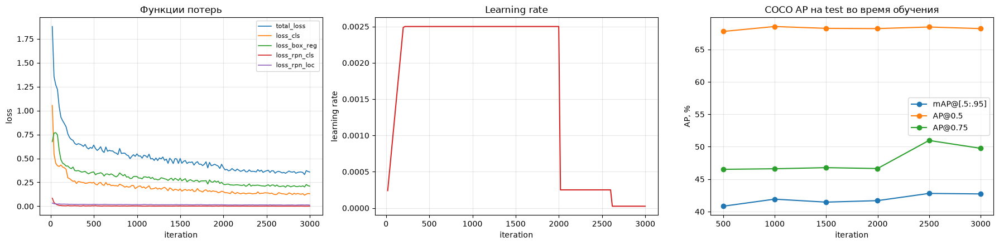

In [14]:
metrics = []
with open(os.path.join(cfg.OUTPUT_DIR, "metrics.json")) as f:
    for line in f:
        line = line.strip()
        if line:
            metrics.append(json.loads(line))

def series(key):
    xs = [m["iteration"] for m in metrics if key in m]
    ys = [m[key] for m in metrics if key in m]
    return xs, ys

fig, axes = plt.subplots(1, 3, figsize=(18, 4.5))

for key in ["total_loss", "loss_cls", "loss_box_reg", "loss_rpn_cls", "loss_rpn_loc"]:
    xs, ys = series(key)
    if xs:
        axes[0].plot(xs, ys, label=key, lw=1.2)
axes[0].set_xlabel("iteration"); axes[0].set_ylabel("loss")
axes[0].set_title("Функции потерь"); axes[0].legend(fontsize=8); axes[0].grid(alpha=.3)

xs, ys = series("lr")
axes[1].plot(xs, ys, color="tab:red")
axes[1].set_xlabel("iteration"); axes[1].set_ylabel("learning rate")
axes[1].set_title("Learning rate"); axes[1].grid(alpha=.3)

for key, lbl in [("bbox/AP", "mAP@[.5:.95]"), ("bbox/AP50", "AP@0.5"), ("bbox/AP75", "AP@0.75")]:
    xs, ys = series(key)
    if xs:
        axes[2].plot(xs, ys, marker="o", label=lbl)
axes[2].set_xlabel("iteration"); axes[2].set_ylabel("AP, %")
axes[2].set_title("COCO AP на test во время обучения"); axes[2].legend(); axes[2].grid(alpha=.3)

plt.tight_layout()
plt.show()

## 3. Инференс обученной модели

In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# (1) Предиктор для «красивой» визуализации — с высоким порогом уверенности.
cfg_vis = cfg.clone()
cfg_vis.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg_vis)

# (2) Предиктор для ОЦЕНКИ метрик — с низким порогом (значение по умолчанию в COCO-протоколе).
#     Высокий порог обрезал бы правый хвост PR-кривой и занижал AP, поэтому для метрик
#     нужен именно низкий порог.
cfg_eval = cfg.clone()
cfg_eval.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05
cfg_eval.TEST.DETECTIONS_PER_IMAGE = 100
eval_predictor = DefaultPredictor(cfg_eval)

print("Веса загружены из", cfg.MODEL.WEIGHTS)
print("порог для визуализации :", cfg_vis.MODEL.ROI_HEADS.SCORE_THRESH_TEST)
print("порог для метрик       :", cfg_eval.MODEL.ROI_HEADS.SCORE_THRESH_TEST)

[08/23 13:08:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


[08/23 13:08:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Веса загружены из ./output/model_final.pth
порог для визуализации : 0.5
порог для метрик       : 0.05


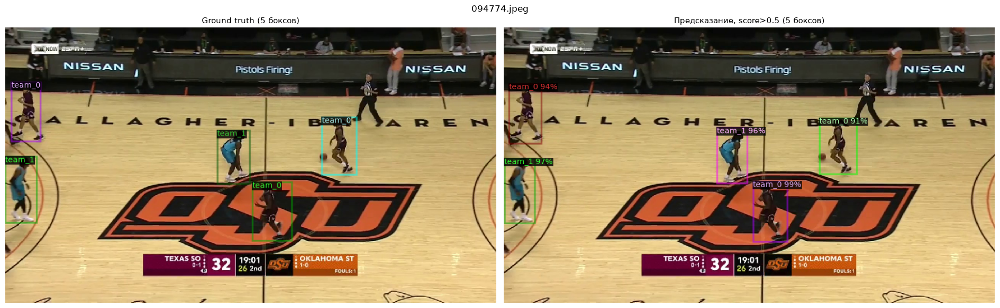

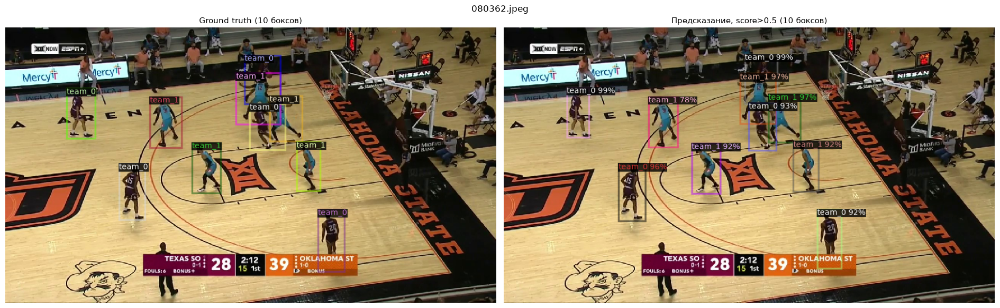

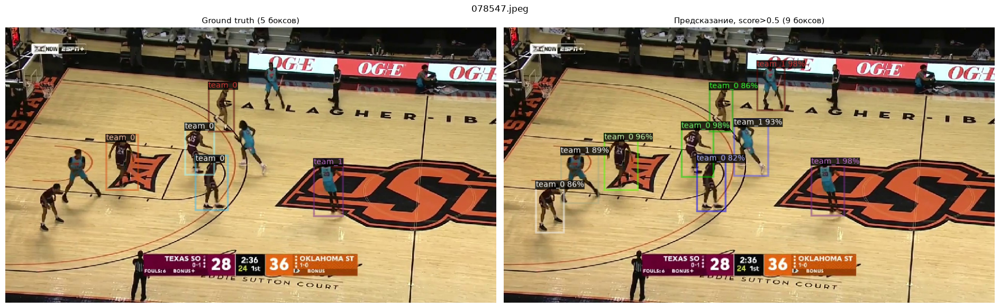

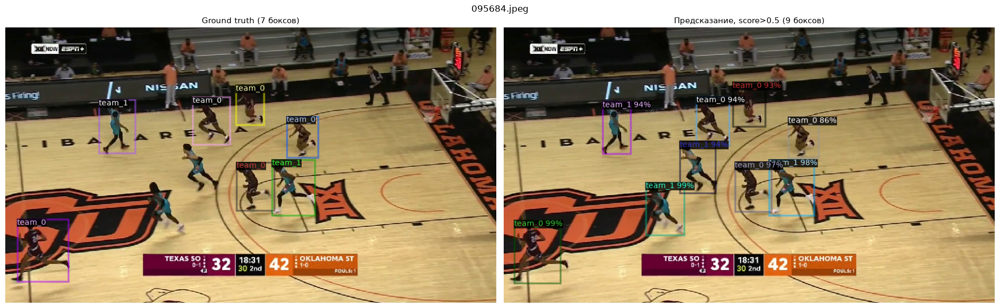

In [16]:
random.seed(SEED)
for d in random.sample(test_dicts, 4):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    inst = outputs["instances"].to("cpu")

    v_gt = Visualizer(img[:, :, ::-1], metadata=basketball_metadata, scale=0.7)
    im_gt = v_gt.draw_dataset_dict(d).get_image()

    v_pr = Visualizer(img[:, :, ::-1], metadata=basketball_metadata, scale=0.7)
    im_pr = v_pr.draw_instance_predictions(inst).get_image()

    fig, axes = plt.subplots(1, 2, figsize=(19, 6))
    show(im_gt, f"Ground truth ({len(d['annotations'])} боксов)", axes[0])
    show(im_pr, f"Предсказание, score>0.5 ({len(inst)} боксов)", axes[1])
    fig.suptitle(os.path.basename(d["file_name"]))
    plt.tight_layout()
    plt.show()

## 4. Метрика COCO mAP (готовая библиотека)

`COCOEvaluator` из Detectron2 — обёртка над `pycocotools`: он конвертирует наш датасет
в COCO-формат и считает стандартный набор метрик COCO.

In [17]:
evaluator = COCOEvaluator(DATASET_NAMES["test"], output_dir=os.path.join(cfg.OUTPUT_DIR, "eval_final"))
test_loader = build_detection_test_loader(cfg_eval, DATASET_NAMES["test"])
coco_results = inference_on_dataset(eval_predictor.model, test_loader, evaluator)

[08/23 13:08:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]


[08/23 13:08:44 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>


[08/23 13:08:44 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...


[08/23 13:08:44 d2.data.common]: Serialized dataset takes 0.05 MiB


[08/23 13:08:44 d2.evaluation.evaluator]: Start inference on 100 batches


[08/23 13:08:44 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0006 s/iter. Inference: 0.0300 s/iter. Eval: 0.0001 s/iter. Total: 0.0307 s/iter. ETA=0:00:02


[08/23 13:08:47 d2.evaluation.evaluator]: Total inference time: 0:00:02.965549 (0.031216 s / iter per device, on 1 devices)


[08/23 13:08:47 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.030169 s / iter per device, on 1 devices)


[08/23 13:08:47 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...


[08/23 13:08:47 d2.evaluation.coco_evaluation]: Saving results to ./output/eval_final/coco_instances_results.json


[08/23 13:08:47 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[08/23 13:08:47 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*


[08/23 13:08:47 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.


[08/23 13:08:47 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[08/23 13:08:47 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.427
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.682
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.427
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.437
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.158
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.651
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.646
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.657
[08/23 13:08:47 d2.evaluation.coco_eva

[08/23 13:08:47 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.


[08/23 13:08:47 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|
| team_0     | 48.394 | team_1     | 37.055 |


In [18]:
bbox_metrics = coco_results["bbox"]

print("=" * 52)
print("COCO bbox метрики на test (pycocotools), %")
print("=" * 52)
for k in ["AP", "AP50", "AP75", "APs", "APm", "APl"]:
    if k in bbox_metrics:
        print(f"  {k:5s} = {bbox_metrics[k]:6.2f}")
print("-" * 52)
for k, v in bbox_metrics.items():
    if k.startswith("AP-"):
        print(f"  {k:10s} = {v:6.2f}")
print("=" * 52)
print(f"\nCOCO mAP@[.50:.95] = {bbox_metrics['AP'] / 100:.4f}")
print(f"COCO mAP@0.50      = {bbox_metrics['AP50'] / 100:.4f}")

COCO bbox метрики на test (pycocotools), %
  AP    =  42.72
  AP50  =  68.21
  AP75  =  49.76
  APs   =    nan
  APm   =  42.67
  APl   =  43.73
----------------------------------------------------
  AP-team_0  =  48.39
  AP-team_1  =  37.06

COCO mAP@[.50:.95] = 0.4272
COCO mAP@0.50      = 0.6821


## 5. Ручная реализация IoU

$$\mathrm{IoU}(A, B) = \frac{|A \cap B|}{|A \cup B|}
= \frac{\text{area}(A \cap B)}{\text{area}(A) + \text{area}(B) - \text{area}(A \cap B)}$$

Боксы в формате `XYXY` (`x0, y0, x1, y1`). Реализуем две версии:
скалярную (для наглядности) и векторизованную (матрица IoU всех пар).

In [19]:
def iou(box_a, box_b):
    '''IoU двух боксов в формате [x0, y0, x1, y1]. Чистый Python, без numpy.'''
    ax0, ay0, ax1, ay1 = box_a
    bx0, by0, bx1, by1 = box_b

    # координаты пересечения
    ix0, iy0 = max(ax0, bx0), max(ay0, by0)
    ix1, iy1 = min(ax1, bx1), min(ay1, by1)

    # ширина/высота пересечения (0, если боксы не пересекаются)
    iw, ih = max(0.0, ix1 - ix0), max(0.0, iy1 - iy0)
    inter = iw * ih
    if inter <= 0.0:
        return 0.0

    area_a = max(0.0, ax1 - ax0) * max(0.0, ay1 - ay0)
    area_b = max(0.0, bx1 - bx0) * max(0.0, by1 - by0)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def iou_matrix(boxes_a, boxes_b):
    '''Векторизованный IoU: (N,4) x (M,4) -> (N,M). Формат XYXY.'''
    a = np.asarray(boxes_a, dtype=np.float64).reshape(-1, 4)
    b = np.asarray(boxes_b, dtype=np.float64).reshape(-1, 4)
    if len(a) == 0 or len(b) == 0:
        return np.zeros((len(a), len(b)), dtype=np.float64)

    # broadcasting: (N,1) vs (1,M)
    ix0 = np.maximum(a[:, None, 0], b[None, :, 0])
    iy0 = np.maximum(a[:, None, 1], b[None, :, 1])
    ix1 = np.minimum(a[:, None, 2], b[None, :, 2])
    iy1 = np.minimum(a[:, None, 3], b[None, :, 3])

    inter = np.clip(ix1 - ix0, 0, None) * np.clip(iy1 - iy0, 0, None)
    area_a = np.clip(a[:, 2] - a[:, 0], 0, None) * np.clip(a[:, 3] - a[:, 1], 0, None)
    area_b = np.clip(b[:, 2] - b[:, 0], 0, None) * np.clip(b[:, 3] - b[:, 1], 0, None)
    union = area_a[:, None] + area_b[None, :] - inter
    return np.where(union > 0, inter / np.maximum(union, 1e-12), 0.0)

### 5.1. Проверка на «ручных» примерах и сверка с `torchvision.ops.box_iou`

In [20]:
cases = [
    ("полное совпадение",        [0, 0, 10, 10], [0, 0, 10, 10],   1.0),
    ("нет пересечения",          [0, 0, 10, 10], [20, 20, 30, 30], 0.0),
    ("касание границами",        [0, 0, 10, 10], [10, 0, 20, 10],  0.0),
    ("вложенный (1/4 площади)",  [0, 0, 10, 10], [0, 0, 5, 10],    0.5),
    ("сдвиг на половину",        [0, 0, 10, 10], [5, 0, 15, 10],   1 / 3),
    ("пересечение по диагонали", [0, 0, 10, 10], [5, 5, 15, 15],   25 / 175),
]
print(f"{'случай':28s} {'IoU (наш)':>10s} {'ожидание':>10s}  ok")
for name, a, b, expected in cases:
    got = iou(a, b)
    print(f"{name:28s} {got:10.6f} {expected:10.6f}  {'OK' if abs(got - expected) < 1e-9 else 'FAIL'}")

случай                        IoU (наш)   ожидание  ok
полное совпадение              1.000000   1.000000  OK
нет пересечения                0.000000   0.000000  OK
касание границами              0.000000   0.000000  OK
вложенный (1/4 площади)        0.500000   0.500000  OK
сдвиг на половину              0.333333   0.333333  OK
пересечение по диагонали       0.142857   0.142857  OK


In [21]:
# Сверка векторизованной версии с эталонной реализацией torchvision на случайных боксах
rng = np.random.default_rng(SEED)
def random_boxes(n, size=1280):
    xy = rng.uniform(0, size, size=(n, 2))
    wh = rng.uniform(5, size / 3, size=(n, 2))
    return np.concatenate([xy, xy + wh], axis=1)

A, B = random_boxes(200), random_boxes(300)
ours = iou_matrix(A, B)
ref = torchvision.ops.box_iou(torch.tensor(A), torch.tensor(B)).numpy()
print("max |наш - torchvision| =", np.abs(ours - ref).max())
assert np.allclose(ours, ref, atol=1e-9)

# и скалярная версия тоже
scalar = np.array([[iou(a, b) for b in B[:50]] for a in A[:50]])
print("max |скаляр - torchvision| =", np.abs(scalar - ref[:50, :50]).max())
assert np.allclose(scalar, ref[:50, :50], atol=1e-9)
print("Обе реализации IoU совпадают с torchvision.ops.box_iou")

max |наш - torchvision| = 0.0
max |скаляр - torchvision| = 0.0
Обе реализации IoU совпадают с torchvision.ops.box_iou


### 5.2. IoU предсказаний с ground truth на реальном кадре

Для каждого предсказанного бокса ищем ground truth с максимальным IoU.

In [22]:
d = test_dicts[0]
img = cv2.imread(d["file_name"])
inst = predictor(img)["instances"].to("cpu")

gt_boxes = np.array([a["bbox"] for a in d["annotations"]], dtype=np.float64)
gt_labels = np.array([a["category_id"] for a in d["annotations"]])
pred_boxes = inst.pred_boxes.tensor.numpy().astype(np.float64)
pred_labels = inst.pred_classes.numpy()
pred_scores = inst.scores.numpy()

M = iou_matrix(pred_boxes, gt_boxes)

print(os.path.basename(d["file_name"]), f"— {len(pred_boxes)} предсказаний, {len(gt_boxes)} GT\n")
print(f"{'#':>2s} {'score':>6s} {'pred cls':>9s} {'best GT':>8s} {'GT cls':>7s} {'IoU':>7s}  вердикт при IoU>=0.5")
for i in range(len(pred_boxes)):
    j = int(M[i].argmax())
    best = M[i, j]
    if best < 0.5:
        verdict = "FP: нет подходящего GT"
        gt_cls, gt_idx = "-", "-"
    else:
        gt_cls, gt_idx = THING_CLASSES[gt_labels[j]], str(j)
        verdict = "TP" if pred_labels[i] == gt_labels[j] else "FP: ОШИБКА КЛАССА"
    print(f"{i:2d} {pred_scores[i]:6.3f} {THING_CLASSES[pred_labels[i]]:>9s} "
          f"{gt_idx:>8s} {gt_cls:>7s} {best:7.3f}  {verdict}")

print("\nМатрица IoU (строки — предсказания, столбцы — GT):")
np.set_printoptions(precision=2, suppress=True, linewidth=140)
print(M)

078176.jpeg — 9 предсказаний, 8 GT

 #  score  pred cls  best GT  GT cls     IoU  вердикт при IoU>=0.5
 0  0.992    team_0        6  team_0   0.951  TP
 1  0.985    team_0        7  team_0   0.904  TP
 2  0.981    team_1        4  team_1   0.910  TP
 3  0.978    team_0        1  team_0   0.848  TP
 4  0.969    team_1        3  team_1   0.960  TP
 5  0.968    team_0        5  team_0   0.851  TP
 6  0.937    team_1        0  team_1   0.801  TP
 7  0.914    team_1        2  team_1   0.924  TP
 8  0.642    team_1        -       -   0.000  FP: нет подходящего GT

Матрица IoU (строки — предсказания, столбцы — GT):
[[0.   0.   0.   0.05 0.   0.   0.95 0.  ]
 [0.   0.   0.   0.07 0.1  0.   0.   0.9 ]
 [0.23 0.   0.   0.16 0.91 0.   0.   0.11]
 [0.18 0.85 0.   0.02 0.   0.   0.   0.  ]
 [0.04 0.   0.   0.96 0.19 0.   0.05 0.1 ]
 [0.   0.   0.14 0.   0.   0.85 0.   0.  ]
 [0.8  0.1  0.   0.04 0.24 0.   0.   0.  ]
 [0.   0.   0.92 0.   0.   0.17 0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0. 

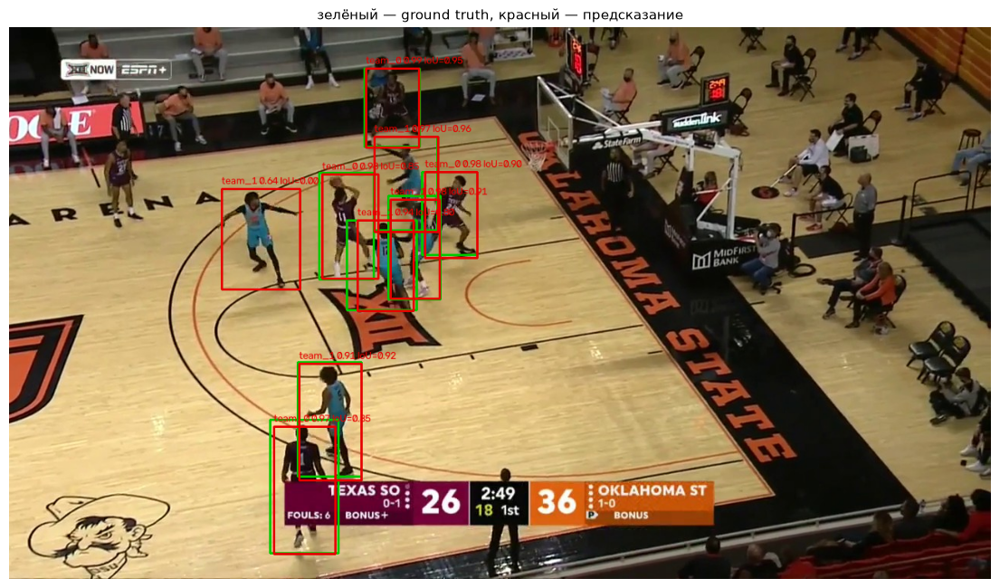

In [23]:
# Нарисуем GT (зелёный) и предсказания (красный) с подписью IoU
vis = img.copy()
for b in gt_boxes.astype(int):
    cv2.rectangle(vis, (b[0], b[1]), (b[2], b[3]), (0, 200, 0), 2)
for i, b in enumerate(pred_boxes.astype(int)):
    cv2.rectangle(vis, (b[0], b[1]), (b[2], b[3]), (0, 0, 230), 2)
    best = M[i].max() if M.shape[1] else 0.0
    cv2.putText(vis, f"{THING_CLASSES[pred_labels[i]]} {pred_scores[i]:.2f} IoU={best:.2f}",
                (b[0], max(14, b[1] - 6)), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 0, 230), 1, cv2.LINE_AA)

show(vis[:, :, ::-1], "зелёный — ground truth, красный — предсказание")
plt.show()

## 6. Ручной расчёт Precision / Recall и PR-кривая

### 6.1. Сбор «сырых» предсказаний по всему test-сету

Используем тот же `eval_predictor` с низким порогом `SCORE_THRESH_TEST = 0.05`, что и
`COCOEvaluator` выше, — тогда ручной расчёт и `pycocotools` работают с **одним и тем же**
набором детекций и результаты можно честно сравнивать.

In [24]:
%%time
ground_truth, detections = {}, []   # detections: dict(image_id, category_id, score, bbox)

for d in test_dicts:
    img = cv2.imread(d["file_name"])
    inst = eval_predictor(img)["instances"].to("cpu")

    ground_truth[d["image_id"]] = {
        "boxes": np.array([a["bbox"] for a in d["annotations"]], dtype=np.float64).reshape(-1, 4),
        "labels": np.array([a["category_id"] for a in d["annotations"]], dtype=int),
    }
    boxes = inst.pred_boxes.tensor.numpy().astype(np.float64)
    for box, score, cls in zip(boxes, inst.scores.numpy(), inst.pred_classes.numpy()):
        detections.append({"image_id": d["image_id"], "category_id": int(cls),
                           "score": float(score), "bbox": box})

n_gt = sum(len(g["labels"]) for g in ground_truth.values())
print(f"собрано {len(detections)} предсказаний на {len(ground_truth)} изображениях; GT боксов: {n_gt}")

собрано 1112 предсказаний на 100 изображениях; GT боксов: 660
CPU times: user 11.1 s, sys: 7.97 ms, total: 11.2 s
Wall time: 4.31 s


### 6.2. Алгоритм

Для фиксированного класса и порога IoU:

1. сортируем **все** детекции этого класса по убыванию `score`;
2. идём по списку сверху вниз; для очередной детекции берём GT того же класса и того же
   изображения с максимальным IoU;
3. если `IoU >= порога` и этот GT ещё **не занят** — это **TP**, помечаем GT занятым;
   иначе — **FP** (дубликат или ложное срабатывание);
4. накапливаем `TP` и `FP`:

$$\text{Precision}(k) = \frac{TP_k}{TP_k + FP_k}, \qquad
  \text{Recall}(k) = \frac{TP_k}{N_{GT}}$$

где $N_{GT}$ — общее число ground-truth объектов класса. Непойманные GT — это **FN**,
они «спрятаны» в знаменателе recall.

AP считаем двумя способами:

* **all-point** (площадь под монотонизированной кривой, как в Pascal VOC 2010+ и в COCO);
* **11-point** (Pascal VOC 2007) — для сравнения.

In [25]:
def match_detections(detections, ground_truth, category_id, iou_thr=0.5):
    '''Жадное сопоставление детекций одного класса с GT. Возвращает (scores, tp, fp, n_gt).'''
    dets = sorted([d for d in detections if d["category_id"] == category_id],
                  key=lambda d: -d["score"])

    # GT данного класса по изображениям + флаги «уже сопоставлен»
    gt_boxes, matched, n_gt = {}, {}, 0
    for img_id, g in ground_truth.items():
        mask = g["labels"] == category_id
        gt_boxes[img_id] = g["boxes"][mask]
        matched[img_id] = np.zeros(int(mask.sum()), dtype=bool)
        n_gt += int(mask.sum())

    tp = np.zeros(len(dets)); fp = np.zeros(len(dets))
    for k, det in enumerate(dets):
        boxes = gt_boxes.get(det["image_id"], np.zeros((0, 4)))
        if len(boxes) == 0:
            fp[k] = 1
            continue
        ious = iou_matrix(det["bbox"][None, :], boxes)[0]   # наша реализация IoU
        j = int(ious.argmax())
        if ious[j] >= iou_thr and not matched[det["image_id"]][j]:
            tp[k] = 1
            matched[det["image_id"]][j] = True              # один GT — максимум один TP
        else:
            fp[k] = 1                                       # дубликат или ложное срабатывание

    return np.array([d["score"] for d in dets]), tp, fp, n_gt


def precision_recall_curve(tp, fp, n_gt):
    '''Кумулятивные precision/recall (детекции уже отсортированы по убыванию score).'''
    tp_cum, fp_cum = np.cumsum(tp), np.cumsum(fp)
    recall = tp_cum / max(n_gt, 1)
    precision = tp_cum / np.maximum(tp_cum + fp_cum, 1e-12)
    return precision, recall


def average_precision(precision, recall, mode="all-point"):
    '''AP как площадь под PR-кривой.'''
    if len(precision) == 0:
        return 0.0
    if mode == "11-point":                      # Pascal VOC 2007
        ap = 0.0
        for t in np.linspace(0, 1, 11):
            p = precision[recall >= t]
            ap += (p.max() if p.size else 0.0) / 11
        return float(ap)

    # all-point: монотонизируем precision справа налево и берём площадь
    mrec = np.concatenate([[0.0], recall, [recall[-1]]])
    mpre = np.concatenate([[1.0], precision, [0.0]])
    for i in range(len(mpre) - 2, -1, -1):
        mpre[i] = max(mpre[i], mpre[i + 1])
    idx = np.where(mrec[1:] != mrec[:-1])[0]
    return float(np.sum((mrec[idx + 1] - mrec[idx]) * mpre[idx + 1]))


def interpolated_curve(precision, recall):
    '''Монотонизированная («ступенчатая») PR-кривая — её и рисуют обычно.'''
    order = np.argsort(recall)
    r, p = recall[order], precision[order]
    p_interp = np.maximum.accumulate(p[::-1])[::-1]
    return p_interp, r

### 6.3. PR-кривые при IoU = 0.5

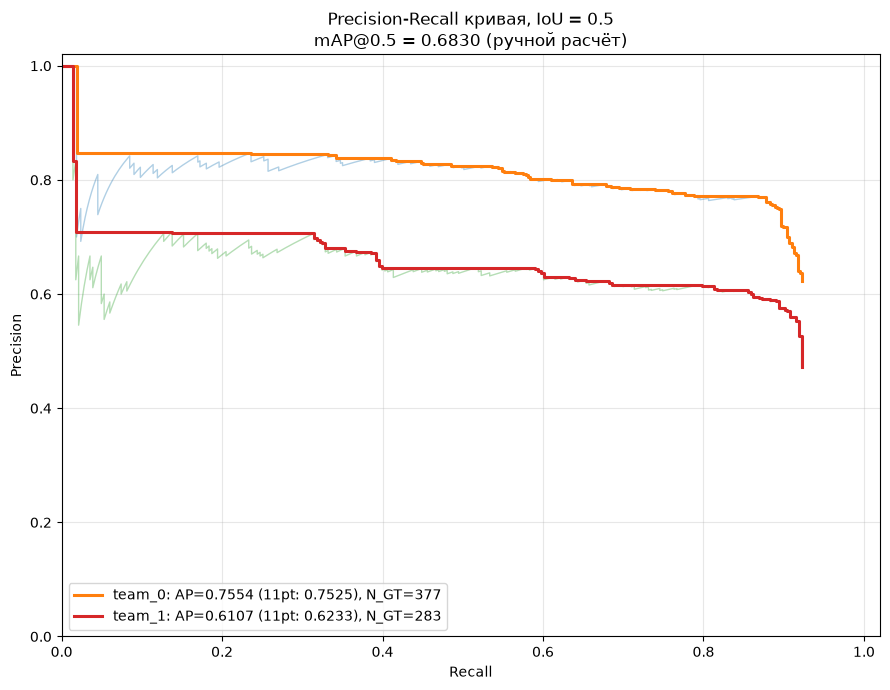

Ручной mAP@0.5      = 0.6830
pycocotools AP50      = 0.6821
расхождение           = 0.0010


In [26]:
IOU_THR = 0.5
curves = {}

fig, ax = plt.subplots(figsize=(9, 7))
for cid, cname in enumerate(THING_CLASSES):
    scores, tp, fp, n_gt = match_detections(detections, ground_truth, cid, IOU_THR)
    precision, recall = precision_recall_curve(tp, fp, n_gt)
    ap_all = average_precision(precision, recall, "all-point")
    ap_11 = average_precision(precision, recall, "11-point")
    curves[cname] = dict(scores=scores, tp=tp, fp=fp, n_gt=n_gt,
                         precision=precision, recall=recall, ap=ap_all, ap11=ap_11)

    p_i, r_i = interpolated_curve(precision, recall)
    ax.plot(recall, precision, lw=1.0, alpha=.35)
    ax.plot(r_i, p_i, lw=2.2, label=f"{cname}: AP={ap_all:.4f} (11pt: {ap_11:.4f}), N_GT={n_gt}")

mAP50 = float(np.mean([c["ap"] for c in curves.values()]))
ax.set_xlabel("Recall"); ax.set_ylabel("Precision")
ax.set_title(f"Precision-Recall кривая, IoU = {IOU_THR}\nmAP@{IOU_THR} = {mAP50:.4f} "
             f"(ручной расчёт)")
ax.set_xlim(0, 1.02); ax.set_ylim(0, 1.02)
ax.grid(alpha=.3); ax.legend(loc="lower left")
plt.tight_layout()
plt.show()

print(f"Ручной mAP@{IOU_THR}      = {mAP50:.4f}")
print(f"pycocotools AP50      = {bbox_metrics['AP50'] / 100:.4f}")
print(f"расхождение           = {abs(mAP50 - bbox_metrics['AP50'] / 100):.4f}")

Тонкая, полупрозрачная линия — «сырая» пилообразная PR-кривая, жирная — её монотонизированная
(интерполированная) версия, площадь под которой и есть AP.

Небольшое расхождение с `pycocotools` ожидаемо: COCO использует интерполяцию по 101 точке
recall и ограничение `maxDets`, а также по-своему обрабатывает `iscrowd`/`area`.

### 6.4. Precision, Recall и F1 в зависимости от порога уверенности

PR-кривая не показывает напрямую, какой порог по score выбрать в проде. Построим
зависимость метрик от порога.

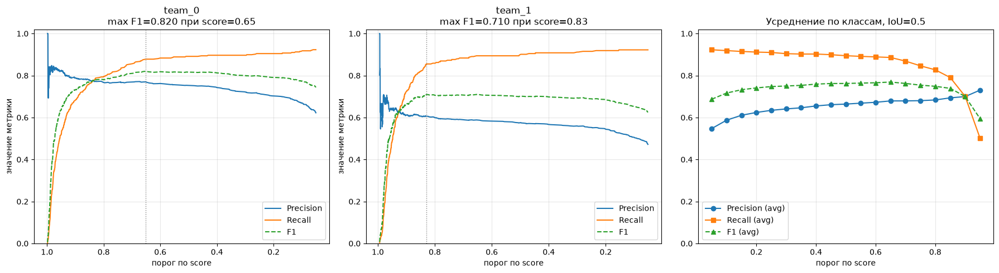

  thr  Precision   Recall       F1
 0.05      0.547    0.923    0.687
 0.10      0.587    0.919    0.716
 0.15      0.611    0.915    0.732
 0.20      0.624    0.912    0.741
 0.25      0.634    0.910    0.747
 0.30      0.641    0.904    0.750
 0.35      0.646    0.902    0.753
 0.40      0.655    0.902    0.759
 0.45      0.661    0.899    0.762
 0.50      0.664    0.894    0.762
 0.55      0.668    0.891    0.764
 0.60      0.672    0.889    0.766
 0.65      0.679    0.886    0.769
 0.70      0.679    0.869    0.762
 0.75      0.680    0.846    0.754
 0.80      0.684    0.827    0.749
 0.85      0.694    0.791    0.739
 0.90      0.700    0.701    0.700
 0.95      0.730    0.502    0.595


In [27]:
fig, axes = plt.subplots(1, len(THING_CLASSES) + 1, figsize=(6 * (len(THING_CLASSES) + 1), 5))

for ax, cname in zip(axes, THING_CLASSES):
    c = curves[cname]
    p, r, s = c["precision"], c["recall"], c["scores"]
    f1 = 2 * p * r / np.maximum(p + r, 1e-12)
    best = int(np.argmax(f1))
    ax.plot(s, p, label="Precision")
    ax.plot(s, r, label="Recall")
    ax.plot(s, f1, label="F1", ls="--")
    ax.axvline(s[best], color="gray", ls=":", lw=1)
    ax.set_title(f"{cname}\nmax F1={f1[best]:.3f} при score={s[best]:.2f}")
    ax.set_xlabel("порог по score"); ax.set_ylabel("значение метрики")
    ax.invert_xaxis(); ax.grid(alpha=.3); ax.legend(); ax.set_ylim(0, 1.02)

# сводная таблица по нескольким порогам (усреднение по классам)
ax = axes[-1]
thresholds = np.arange(0.05, 1.0, 0.05)
rows = []
for t in thresholds:
    ps, rs = [], []
    for cname in THING_CLASSES:
        c = curves[cname]
        keep = c["scores"] >= t
        tp_n, fp_n = c["tp"][keep].sum(), c["fp"][keep].sum()
        ps.append(tp_n / max(tp_n + fp_n, 1e-12))
        rs.append(tp_n / max(c["n_gt"], 1))
    rows.append((t, np.mean(ps), np.mean(rs)))
rows = np.array(rows)
f1m = 2 * rows[:, 1] * rows[:, 2] / np.maximum(rows[:, 1] + rows[:, 2], 1e-12)
ax.plot(rows[:, 0], rows[:, 1], marker="o", label="Precision (avg)")
ax.plot(rows[:, 0], rows[:, 2], marker="s", label="Recall (avg)")
ax.plot(rows[:, 0], f1m, marker="^", ls="--", label="F1 (avg)")
ax.set_xlabel("порог по score"); ax.set_title(f"Усреднение по классам, IoU={IOU_THR}")
ax.grid(alpha=.3); ax.legend(); ax.set_ylim(0, 1.02)

plt.tight_layout()
plt.show()

print(f"{'thr':>5s} {'Precision':>10s} {'Recall':>8s} {'F1':>8s}")
for (t, p, r), f in zip(rows, f1m):
    print(f"{t:5.2f} {p:10.3f} {r:8.3f} {f:8.3f}")

### 6.5. Ручной расчёт mAP@[.50:.95]

Повторим расчёт AP для 10 порогов IoU (0.50, 0.55, ..., 0.95) — это и есть основная
метрика COCO. Сверим с `pycocotools`.

In [28]:
%%time
iou_thresholds = np.round(np.arange(0.5, 1.0, 0.05), 2)
ap_table = np.zeros((len(THING_CLASSES), len(iou_thresholds)))

for ci, cname in enumerate(THING_CLASSES):
    for ti, thr in enumerate(iou_thresholds):
        _, tp, fp, n_gt = match_detections(detections, ground_truth, ci, thr)
        precision, recall = precision_recall_curve(tp, fp, n_gt)
        ap_table[ci, ti] = average_precision(precision, recall, "all-point")

header = "  ".join(f"{t:.2f}" for t in iou_thresholds)
print(f"{'класс':>8s}  {header}   {'AP@[.5:.95]':>11s}")
for ci, cname in enumerate(THING_CLASSES):
    row = "  ".join(f"{v:.2f}" for v in ap_table[ci])
    print(f"{cname:>8s}  {row}   {ap_table[ci].mean():11.4f}")
print()

manual_mAP = float(ap_table.mean())
print(f"Ручной      mAP@[.50:.95] = {manual_mAP:.4f}   |  mAP@0.5 = {ap_table[:, 0].mean():.4f}")
print(f"pycocotools mAP@[.50:.95] = {bbox_metrics['AP'] / 100:.4f}   |  AP50    = {bbox_metrics['AP50'] / 100:.4f}")

   класс  0.50  0.55  0.60  0.65  0.70  0.75  0.80  0.85  0.90  0.95   AP@[.5:.95]
  team_0  0.76  0.76  0.75  0.73  0.67  0.57  0.41  0.17  0.04  0.00        0.4847
  team_1  0.61  0.60  0.60  0.58  0.51  0.43  0.27  0.09  0.02  0.00        0.3705

Ручной      mAP@[.50:.95] = 0.4276   |  mAP@0.5 = 0.6830
pycocotools mAP@[.50:.95] = 0.4272   |  AP50    = 0.6821
CPU times: user 270 ms, sys: 8 ms, total: 278 ms
Wall time: 271 ms


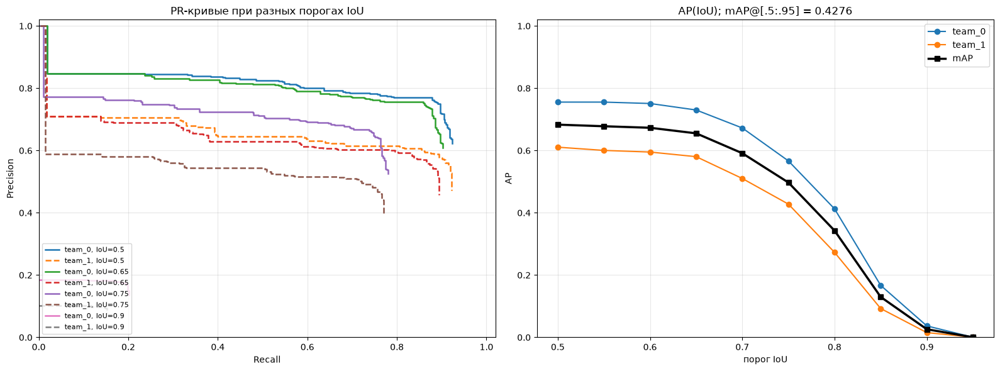

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PR-кривые для нескольких порогов IoU (усреднённые по классам через микро-объединение)
for thr in [0.5, 0.65, 0.75, 0.9]:
    for ci, cname in enumerate(THING_CLASSES):
        _, tp, fp, n_gt = match_detections(detections, ground_truth, ci, thr)
        precision, recall = precision_recall_curve(tp, fp, n_gt)
        p_i, r_i = interpolated_curve(precision, recall)
        axes[0].plot(r_i, p_i, lw=1.8, ls="-" if ci == 0 else "--",
                     label=f"{cname}, IoU={thr}")
axes[0].set_xlabel("Recall"); axes[0].set_ylabel("Precision")
axes[0].set_title("PR-кривые при разных порогах IoU")
axes[0].set_xlim(0, 1.02); axes[0].set_ylim(0, 1.02); axes[0].grid(alpha=.3)
axes[0].legend(fontsize=8, loc="lower left")

# AP как функция порога IoU
for ci, cname in enumerate(THING_CLASSES):
    axes[1].plot(iou_thresholds, ap_table[ci], marker="o", label=cname)
axes[1].plot(iou_thresholds, ap_table.mean(0), marker="s", lw=2.5, color="k", label="mAP")
axes[1].set_xlabel("порог IoU"); axes[1].set_ylabel("AP")
axes[1].set_title(f"AP(IoU); mAP@[.5:.95] = {manual_mAP:.4f}")
axes[1].grid(alpha=.3); axes[1].legend(); axes[1].set_ylim(0, 1.02)

plt.tight_layout()
plt.show()

## 7. Анализ ошибок

Посмотрим на кадры с наибольшим числом ошибок при рабочем пороге `score = 0.5`, IoU = 0.5.

In [30]:
SCORE_THR = 0.5

per_image = []
for img_id, g in ground_truth.items():
    dets = [d for d in detections if d["image_id"] == img_id and d["score"] >= SCORE_THR]
    dets.sort(key=lambda d: -d["score"])
    used = np.zeros(len(g["labels"]), dtype=bool)
    tp = fp = 0
    for det in dets:
        cand = np.where((g["labels"] == det["category_id"]) & (~used))[0]
        if len(cand):
            ious = iou_matrix(det["bbox"][None, :], g["boxes"][cand])[0]
            j = int(ious.argmax())
            if ious[j] >= IOU_THR:
                used[cand[j]] = True
                tp += 1
                continue
        fp += 1
    per_image.append({"image_id": img_id, "tp": tp, "fp": fp, "fn": int((~used).sum())})

tot_tp = sum(x["tp"] for x in per_image)
tot_fp = sum(x["fp"] for x in per_image)
tot_fn = sum(x["fn"] for x in per_image)
print(f"score>={SCORE_THR}, IoU>={IOU_THR}:  TP={tot_tp}  FP={tot_fp}  FN={tot_fn}")
print(f"Precision = {tot_tp / max(tot_tp + tot_fp, 1):.4f}")
print(f"Recall    = {tot_tp / max(tot_tp + tot_fn, 1):.4f}")
print(f"F1        = {2 * tot_tp / max(2 * tot_tp + tot_fp + tot_fn, 1):.4f}")

worst = sorted(per_image, key=lambda x: -(x["fp"] + x["fn"]))[:3]
print("\nХудшие кадры:", [(w["image_id"], f"FP={w['fp']}", f"FN={w['fn']}") for w in worst])

score>=0.5, IoU>=0.5:  TP=590  FP=298  FN=70
Precision = 0.6644
Recall    = 0.8939
F1        = 0.7623

Худшие кадры: [(55, 'FP=8', 'FN=5'), (8, 'FP=7', 'FN=1'), (9, 'FP=5', 'FN=3')]


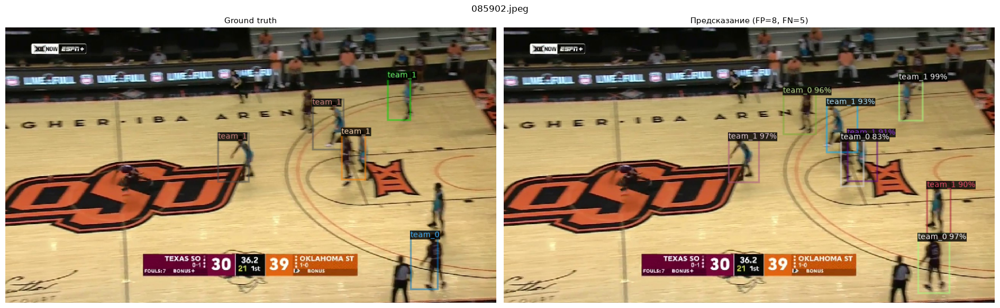

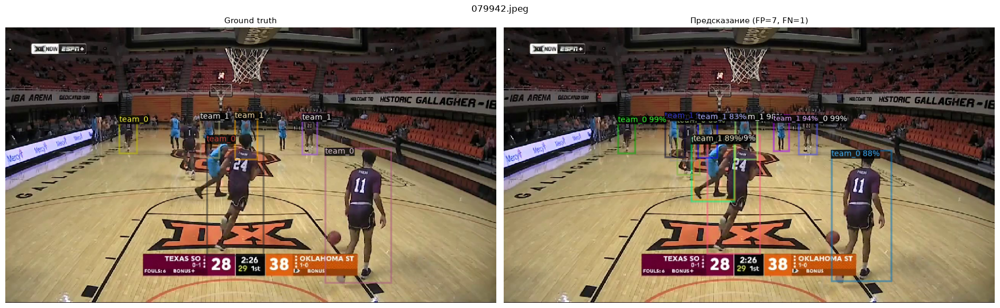

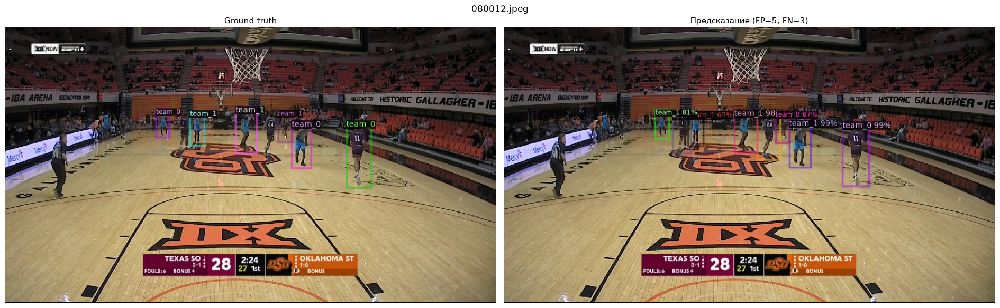

In [31]:
by_id = {d["image_id"]: d for d in test_dicts}
for w in worst:
    d = by_id[w["image_id"]]
    img = cv2.imread(d["file_name"])
    inst = predictor(img)["instances"].to("cpu")

    v_gt = Visualizer(img[:, :, ::-1], metadata=basketball_metadata, scale=0.7)
    v_pr = Visualizer(img[:, :, ::-1], metadata=basketball_metadata, scale=0.7)
    fig, axes = plt.subplots(1, 2, figsize=(19, 6))
    show(v_gt.draw_dataset_dict(d).get_image(), "Ground truth", axes[0])
    show(v_pr.draw_instance_predictions(inst).get_image(),
         f"Предсказание (FP={w['fp']}, FN={w['fn']})", axes[1])
    fig.suptitle(os.path.basename(d["file_name"]))
    plt.tight_layout()
    plt.show()

## 8. Итоги

Что сделано:

1. **Адаптация датасета.** Написана функция `get_basketball_dicts`, переводящая
   аннотации `otus_basketball_dataset_v2` (нормированные `[x, y, w, h]`, поле `team`)
   во внутренний формат Detectron2 (`XYXY_ABS`, `category_id`), с обрезкой боксов по
   границам кадра. Датасеты зарегистрированы в `DatasetCatalog` / `MetadataCatalog`
   как `basketball_train` (400 изображений) и `basketball_test` (100 изображений).

2. **Обучение.** Предобученная на COCO `faster_rcnn_R_50_FPN_3x` дообучена 3000 итераций
   (~30 эпох) с двухступенчатым снижением LR.

3. **COCO mAP** посчитан готовой библиотекой (`pycocotools` через `COCOEvaluator`).

4. **IoU** реализован вручную (скалярная и векторизованная версии) и **совпадает с
   `torchvision.ops.box_iou`** с точностью до 1e-9.

5. **Precision / Recall** посчитаны вручную (жадное сопоставление детекций с GT по убыванию
   score, один GT — не более одного TP), построены PR-кривые для обоих классов и для разных
   порогов IoU, посчитан AP (all-point и 11-point) и mAP@[.50:.95]. Результат ручного расчёта
   близок к `pycocotools`.

Итоговые числа выводятся в ячейке ниже.

In [32]:
print("=" * 60)
print("ИТОГОВЫЕ МЕТРИКИ НА TEST (100 изображений, 2 класса)")
print("=" * 60)
print(f"{'метрика':<34s}{'pycocotools':>13s}{'вручную':>13s}")
print("-" * 60)
print(f"{'mAP@[.50:.95]':<34s}{bbox_metrics['AP'] / 100:13.4f}{manual_mAP:13.4f}")
print(f"{'mAP@0.50':<34s}{bbox_metrics['AP50'] / 100:13.4f}{ap_table[:, 0].mean():13.4f}")
print(f"{'mAP@0.75':<34s}{bbox_metrics['AP75'] / 100:13.4f}{ap_table[:, 5].mean():13.4f}")
print("-" * 60)
for ci, cname in enumerate(THING_CLASSES):
    key = f"AP-{cname}"
    ref = bbox_metrics.get(key, float('nan')) / 100
    print(f"{'AP@[.50:.95] ' + cname:<34s}{ref:13.4f}{ap_table[ci].mean():13.4f}")
print("-" * 60)
print(f"{'Precision (score>=0.5, IoU>=0.5)':<34s}{'':>13s}{tot_tp / max(tot_tp + tot_fp, 1):13.4f}")
print(f"{'Recall    (score>=0.5, IoU>=0.5)':<34s}{'':>13s}{tot_tp / max(tot_tp + tot_fn, 1):13.4f}")
print("=" * 60)

ИТОГОВЫЕ МЕТРИКИ НА TEST (100 изображений, 2 класса)
метрика                             pycocotools      вручную
------------------------------------------------------------
mAP@[.50:.95]                            0.4272       0.4276
mAP@0.50                                 0.6821       0.6830
mAP@0.75                                 0.4976       0.4971
------------------------------------------------------------
AP@[.50:.95] team_0                      0.4839       0.4847
AP@[.50:.95] team_1                      0.3706       0.3705
------------------------------------------------------------
Precision (score>=0.5, IoU>=0.5)                      0.6644
Recall    (score>=0.5, IoU>=0.5)                      0.8939
